# Project n°1 - Cat or dogs ?

Authors : Selim Ben Abdallah, Paola De Truchis, Eduardo De Jesus Zancanaro Garcia et Edda Iveland

* The goal of this project is to study, classify and segment the images in the `Oxford-IIIT Pet` dataset.
* This dataset contains images and lables of cats and dogs of 37 different races. 
We will start by loading the data, then perform an exploratory analysis.

---------

### Plan : 

* 0 - Libraries, util functions, global variables, ...
* 1 - Exploratory Data Analysis
* 2 - Binary Classification
* 3 - Multiclass Classification
* 4 - Segmentation
* 5 - Comparision, Conclusion


----

## 0 - Libraries, data, util functions, variables, ...

In [1]:
PATH_TO_TRAINVAL_TXT = "dataset/annotations/trainval.txt"
PATH_TO_TEST_TXT = "dataset/annotations/test.txt"
PATH_TO_LIST_TXT = "dataset/annotations/list.txt"

PATH_TO_IMG = "dataset/images/" # .jpg
PATH_TO_TRIMAPS = "dataset/annotations/trimaps/" #.png
PATH_TO_XML = "dataset/annotations/xmls/" #.xml

In [2]:
import os
import random
import numpy as np
import pandas as pd
from tqdm import tqdm
import seaborn as sns
from PIL import Image
import matplotlib.patches as patches
import matplotlib.pyplot as plt

from pathlib import Path
import xml.etree.ElementTree as ET

import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

# Sklearn
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_auc_score, classification_report, roc_curve, average_precision_score, precision_recall_curve



## 1 - Exploratory Data Analysis

### DataFrame construction

- The `dataset` contains two subfolders, `dataset/annotations/` and `dataset/images/`
- Let's first create a DataFrame with all the information we can collet from these subfolders.

In [3]:
data = []

with open(PATH_TO_LIST_TXT, 'r') as f:
    # we skip the first 6 lines (header)
    for _ in range(6):
        next(f)

    for line in f:
        line = line.strip()
        # we skip empty lines if any
        if not line:
            continue

        class_id, id_, species, breed_id = line.split()
        breed_name = "_".join(class_id.split("_")[:-1]) # breed name

        data.append({
            "class_id": class_id,
            "id": int(id_) - 1, # 0-indexed
            "species": int(species) - 1, # 0: cat, 1: dog
            "breed_id": int(breed_id) - 1, # 0-24:Cat 0:11:Dog
            "breed_name": breed_name,
        })

df = pd.DataFrame(data)
df["species_name"] = df["species"].map({0: "Cat", 1: "Dog"})
df["img_path"] = df["class_id"].apply(lambda x: f"{PATH_TO_IMG}{x}.jpg")
df["trimap_path"] = df["class_id"].apply(lambda x: f"{PATH_TO_TRIMAPS}{x}.png")
df = df.set_index("class_id", drop=False)
df.head()

,class_id,id,species,breed_id,breed_name,species_name,img_path,trimap_path
class_id,,,,,,,,
Abyssinian_100,Abyssinian_100,0,0,0,Abyssinian,Cat,dataset/images/Abyssinian_100.jpg,dataset/annotations/trimaps/Abyssinian_100.png
Abyssinian_101,Abyssinian_101,0,0,0,Abyssinian,Cat,dataset/images/Abyssinian_101.jpg,dataset/annotations/trimaps/Abyssinian_101.png
Abyssinian_102,Abyssinian_102,0,0,0,Abyssinian,Cat,dataset/images/Abyssinian_102.jpg,dataset/annotations/trimaps/Abyssinian_102.png
Abyssinian_103,Abyssinian_103,0,0,0,Abyssinian,Cat,dataset/images/Abyssinian_103.jpg,dataset/annotations/trimaps/Abyssinian_103.png
Abyssinian_104,Abyssinian_104,0,0,0,Abyssinian,Cat,dataset/images/Abyssinian_104.jpg,dataset/annotations/trimaps/Abyssinian_104.png


In [4]:
with open(PATH_TO_TRAINVAL_TXT, 'r') as f:
    trainval_ids = set()
    for line in f:
        line = line.strip()
        if not line:
            continue
        
        class_id, id_, species, breed_id = line.split()
        trainval_ids.add(class_id)

with open(PATH_TO_TEST_TXT, 'r') as f:
    test_ids = set()
    for line in f:
        line = line.strip()
        if not line:
            continue
        
        class_id, id_, species, breed_id = line.split()
        test_ids.add(class_id)

df["default_split"] = "unassigned"
df.loc[df["class_id"].isin(trainval_ids), "default_split"] = "trainval"
df.loc[df["class_id"].isin(test_ids), "default_split"] = "test"

- We have extracted information from `dataset/images`, `dataset/annotations/trimaps`, we can complete our DataFrame with the data from the `_.xml` files in `dataset/annotations/xmls`

In [5]:
def parse_xml(class_id):
    path = Path(PATH_TO_XML) / f"{class_id}.xml"
    if not path.exists():
        return {}

    root = ET.parse(path).getroot()

    size = root.find("size")
    obj = root.find("object")
    box = obj.find("bndbox")

    return {
        "width":     int(size.find("width").text),
        "height":    int(size.find("height").text),
        "depth":     int(size.find("depth").text),
        "segmented": int(root.find("segmented").text),
        #"xml_species": obj.find("name").text, we already have species info
        "pose":        obj.find("pose").text,
        "truncated":   int(obj.find("truncated").text),
        "occluded":    int(obj.find("occluded").text),
        "difficult":   int(obj.find("difficult").text),
        "bb_xmin": int(box.find("xmin").text),
        "bb_ymin": int(box.find("ymin").text),
        "bb_xmax": int(box.find("xmax").text),
        "bb_ymax": int(box.find("ymax").text),
        "xml_path": str(path),
    }


df = df.set_index("class_id", drop=False)

for col in [
    "width","height","depth","segmented","pose",
    "truncated","occluded","difficult","bb_xmin","bb_ymin","bb_xmax","bb_ymax"
]:
    df[col] = pd.NA

for cid in df.index:
    for k, v in parse_xml(cid).items():
        df.at[cid, k] = v

col_1 = df.pop("img_path")
col_2 = df.pop("trimap_path")
df.insert(len(df.columns), "img_path", col_1)
df.insert(len(df.columns), "trimap_path", col_2)

df.head(10)


,class_id,id,species,breed_id,breed_name,species_name,default_split,width,height,depth,...,truncated,occluded,difficult,bb_xmin,bb_ymin,bb_xmax,bb_ymax,xml_path,img_path,trimap_path
class_id,,,,,,,,,,,,,,,,,,,,,
Abyssinian_100,Abyssinian_100,0,0,0,Abyssinian,Cat,trainval,394,500,3,...,0,0,0,151,71,335,267,dataset/annotations/xmls/Abyssinian_100.xml,dataset/images/Abyssinian_100.jpg,dataset/annotations/trimaps/Abyssinian_100.png
Abyssinian_101,Abyssinian_101,0,0,0,Abyssinian,Cat,trainval,450,313,3,...,0,0,0,54,36,319,235,dataset/annotations/xmls/Abyssinian_101.xml,dataset/images/Abyssinian_101.jpg,dataset/annotations/trimaps/Abyssinian_101.png
Abyssinian_102,Abyssinian_102,0,0,0,Abyssinian,Cat,trainval,500,465,3,...,0,0,0,23,27,325,320,dataset/annotations/xmls/Abyssinian_102.xml,dataset/images/Abyssinian_102.jpg,dataset/annotations/trimaps/Abyssinian_102.png
Abyssinian_103,Abyssinian_103,0,0,0,Abyssinian,Cat,trainval,500,351,3,...,0,0,0,241,68,362,196,dataset/annotations/xmls/Abyssinian_103.xml,dataset/images/Abyssinian_103.jpg,dataset/annotations/trimaps/Abyssinian_103.png
Abyssinian_104,Abyssinian_104,0,0,0,Abyssinian,Cat,trainval,<NA>,<NA>,<NA>,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,NaN,dataset/images/Abyssinian_104.jpg,dataset/annotations/trimaps/Abyssinian_104.png
Abyssinian_105,Abyssinian_105,0,0,0,Abyssinian,Cat,trainval,500,375,3,...,0,0,0,237,101,373,227,dataset/annotations/xmls/Abyssinian_105.xml,dataset/images/Abyssinian_105.jpg,dataset/annotations/trimaps/Abyssinian_105.png
Abyssinian_106,Abyssinian_106,0,0,0,Abyssinian,Cat,trainval,1536,1024,3,...,0,0,0,861,156,1302,563,dataset/annotations/xmls/Abyssinian_106.xml,dataset/images/Abyssinian_106.jpg,dataset/annotations/trimaps/Abyssinian_106.png
Abyssinian_107,Abyssinian_107,0,0,0,Abyssinian,Cat,trainval,500,448,3,...,0,0,0,94,76,275,271,dataset/annotations/xmls/Abyssinian_107.xml,dataset/images/Abyssinian_107.jpg,dataset/annotations/trimaps/Abyssinian_107.png
Abyssinian_108,Abyssinian_108,0,0,0,Abyssinian,Cat,trainval,500,404,3,...,0,0,0,50,14,336,304,dataset/annotations/xmls/Abyssinian_108.xml,dataset/images/Abyssinian_108.jpg,dataset/annotations/trimaps/Abyssinian_108.png


In [6]:
print("Are all rows unique ?", not df.duplicated().any())

Are all rows unique ? True


- All rows are unique, no duplicates in the dataframe

In [7]:
def count_files(path_to_img, path_to_xml, path_to_trimaps):
    trimaps_count = len(list(Path(path_to_trimaps).glob("*.png")))
    img_count = len(list(Path(path_to_img).glob("*.jpg")))
    xml_count = len(list(Path(path_to_xml).glob("*.xml")))
    return img_count, xml_count, trimaps_count

img_count, xml_count, trimaps_count = count_files(PATH_TO_IMG, PATH_TO_XML, PATH_TO_TRIMAPS)
print("Number of PNG files (masks):", trimaps_count)
print("Number of JPG files (images):", img_count)
print("Number of XML files (additional info):", xml_count)

Number of PNG files (masks): 7390
Number of JPG files (images): 7390
Number of XML files (additional info): 3686


- There are 7390 images, associated to 7390 segmentation masks
- However the data from the .xml files (bounding box, pose, ...) is missing for 3704 images

In [8]:
df.isna().sum().sort_values(ascending=False)

pose             3678
difficult        3678
xml_path         3678
bb_ymax          3678
bb_xmax          3678
bb_ymin          3678
width            3678
height           3678
depth            3678
segmented        3678
bb_xmin          3678
truncated        3678
occluded         3678
img_path            0
class_id            0
id                  0
default_split       0
species_name        0
breed_name          0
breed_id            0
species             0
trimap_path         0
dtype: int64

### Train / Val / Test distribution

In [9]:
df["default_split"].value_counts()

default_split
trainval    3680
test        3669
Name: count, dtype: int64

- The default trainval / test split is balanced in terms of size, but not ideal for deep learning
- The default split has not a proper validation set, so as is, we can't monitor overfitting, learning curves, hyperparemeters tuning.
- Also, the defualt split is not identical per breed, is not stratified, and imbalanced for some breeds (-11 image imbalance for the stafford_bull_terrier breed between the default trainval and test splits, -8 image imbalance for the Bombay breed between the trainval and test splits)
- The default test set is to large

In [10]:
pd.crosstab(df["breed_name"], df["default_split"])

default_split,test,trainval
breed_name,,
Abyssinian,98,100
Bengal,100,100
Birman,100,100
Bombay,88,96
British_Shorthair,100,100
Egyptian_Mau,97,93
Maine_Coon,100,100
Persian,100,100
Ragdoll,100,100


- We are going to re-split our dataset (80% : train, 10% val, 10% test), such that we can make it more efficient for our incoming deep learning tasks, and to be able to monitor the risk of overfitting, hyperparameter tunning and losses.
- We will make sure the new split is stratified, so that each breeds are well represented in each set

In [11]:
# we first split into train+val and test
train_ids, test_ids = train_test_split(
    df.index,
    test_size=0.1,
    stratify=df["breed_id"],
    random_state=42
)

# we then split train into train and val
train_ids, val_ids = train_test_split(
    train_ids,
    test_size=0.1 / 0.9,  # ensures final 80/10/10
    stratify=df.loc[train_ids, "breed_id"],
    random_state=42
)

df["new_split"] = "train"
df.loc[val_ids, "new_split"] = "val"
df.loc[test_ids, "new_split"] = "test"

breed_crosstab = pd.crosstab(df["breed_name"], df["new_split"])
breed_crosstab

new_split,test,train,val
breed_name,,,
Abyssinian,16,161,21
Bengal,17,167,16
Birman,17,162,21
Bombay,25,137,22
British_Shorthair,22,163,15
Egyptian_Mau,23,150,17
Maine_Coon,20,167,13
Persian,27,152,21
Ragdoll,20,164,16


In [12]:
proportion_per_breed = breed_crosstab.div(breed_crosstab.sum(axis=1), axis=0)
ideal_breed_proportions = pd.Series({"train": 0.80, "val": 0.10, "test": 0.10})
variance_relative_to_ideal_prop = ((proportion_per_breed - ideal_breed_proportions) ** 2).mean(axis=1)

summary_proportion_per_breed = pd.DataFrame({
    "train_prop": proportion_per_breed["train"],
    "val_prop": proportion_per_breed["val"],
    "test_prop": proportion_per_breed["test"],
    "variance_from_ideal": variance_relative_to_ideal_prop,
})

summary_proportion_per_breed.sort_values("variance_from_ideal")

,train_prop,val_prop,test_prop,variance_from_ideal
breed_name,,,,
yorkshire_terrier,0.800000,0.100000,0.100000,0.000000e+00
shiba_inu,0.800000,0.100000,0.100000,0.000000e+00
samoyed,0.800000,0.100000,0.100000,0.000000e+00
saint_bernard,0.800000,0.100000,0.100000,0.000000e+00
pug,0.800000,0.100000,0.100000,0.000000e+00
pomeranian,0.800000,0.100000,0.100000,0.000000e+00
miniature_pinscher,0.800000,0.100000,0.100000,0.000000e+00
leonberger,0.800000,0.100000,0.100000,0.000000e+00
wheaten_terrier,0.800000,0.100000,0.100000,0.000000e+00


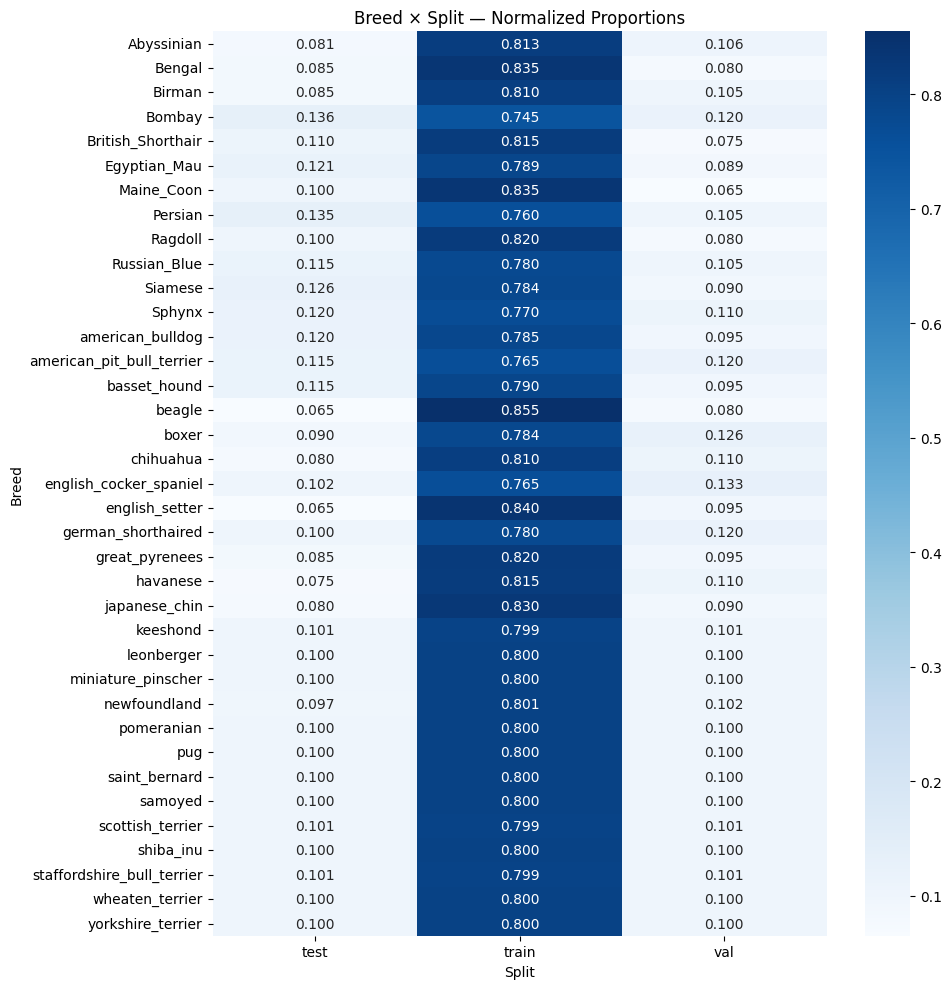

In [13]:
plt.figure(figsize=(10,10))
sns.heatmap(proportion_per_breed, annot=True, fmt=".3f", cmap="Blues")
plt.title("Breed × Split — Normalized Proportions")
plt.xlabel("Split")
plt.ylabel("Breed")
plt.tight_layout()
plt.show()


- With this new data split, we have roughly 80% of each breed in the train set, 10% in the val set, and 10% in the test set.

### Breed & Species distribution

#### Dog vs Cats

Total Number of Animals : 7349
Number of Dogs : 4978
Number of Cats : 2371


Text(0.5, 1.0, 'Species Distribution')

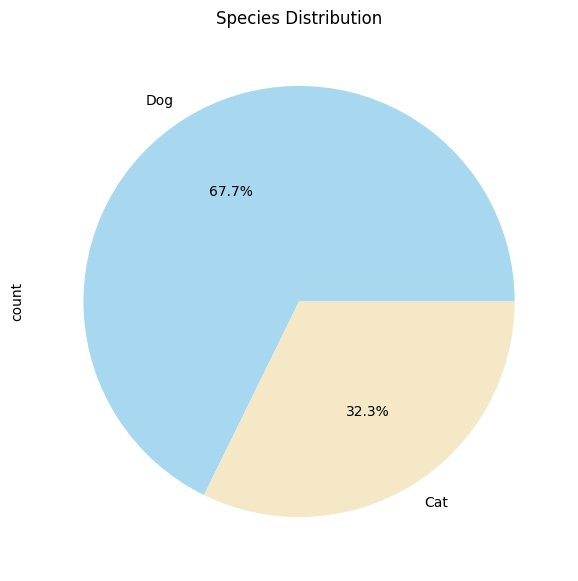

In [14]:
print("Total Number of Animals :", df.shape[0])
print("Number of Dogs :", df[df["species_name"] == "Dog"].shape[0])
print("Number of Cats :", df[df["species_name"] == "Cat"].shape[0])

df["species_name"].value_counts().plot(
    kind="pie",
    autopct="%1.1f%%",
    figsize=(7,7),
    colors = ["#A7D8F0", "#F5E8C7"]
)
plt.title("Species Distribution")

- There are more dog images (67.7%, 4978) than cat images (32.3%, 2371), which highlights an important class imbalance.

- For the binary classification (cat vs dog) :  we will need to either use a weighted loss so the network penalizes mistakes on cats more fairly, oversample cats or undersample dogs, or maybe apply stronger augmentation to cats. We will also need to consider per-class metrics (precision per class, recall per class, f1-score, and not only the accuracy that may hide some bias)

- For the multiclass classification (37 breeds) : We have already constructed the train/val/test sets with a stratified splitting so that each breed appears with the correct (80/10/10) proportion. We can also consider using a weighted loss, data augmentation, and evaluate our model with macro metrics (macro F1, macro recall, balanced accuracy)

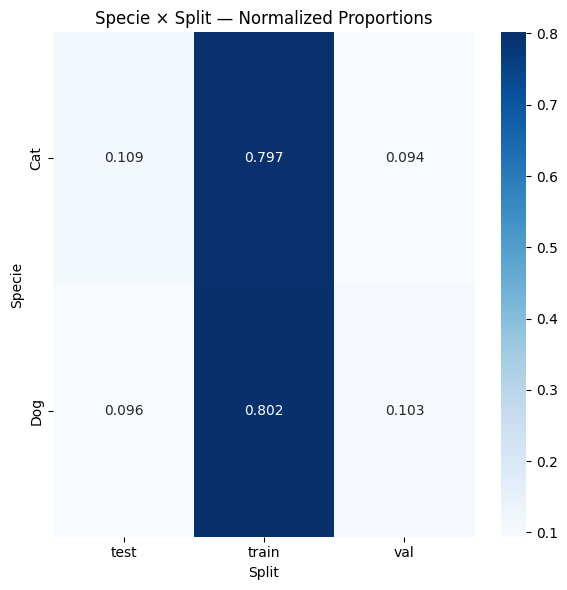

In [15]:
species_crosstab = pd.crosstab(df["species_name"], df["new_split"])
propertion_per_specie = species_crosstab.div(species_crosstab.sum(axis=1), axis=0)
species_crosstab

plt.figure(figsize=(6,6))
sns.heatmap(propertion_per_specie, annot=True, fmt=".3f", cmap="Blues")
plt.title("Specie × Split — Normalized Proportions")
plt.xlabel("Split")
plt.ylabel("Specie")
plt.tight_layout()
plt.show()

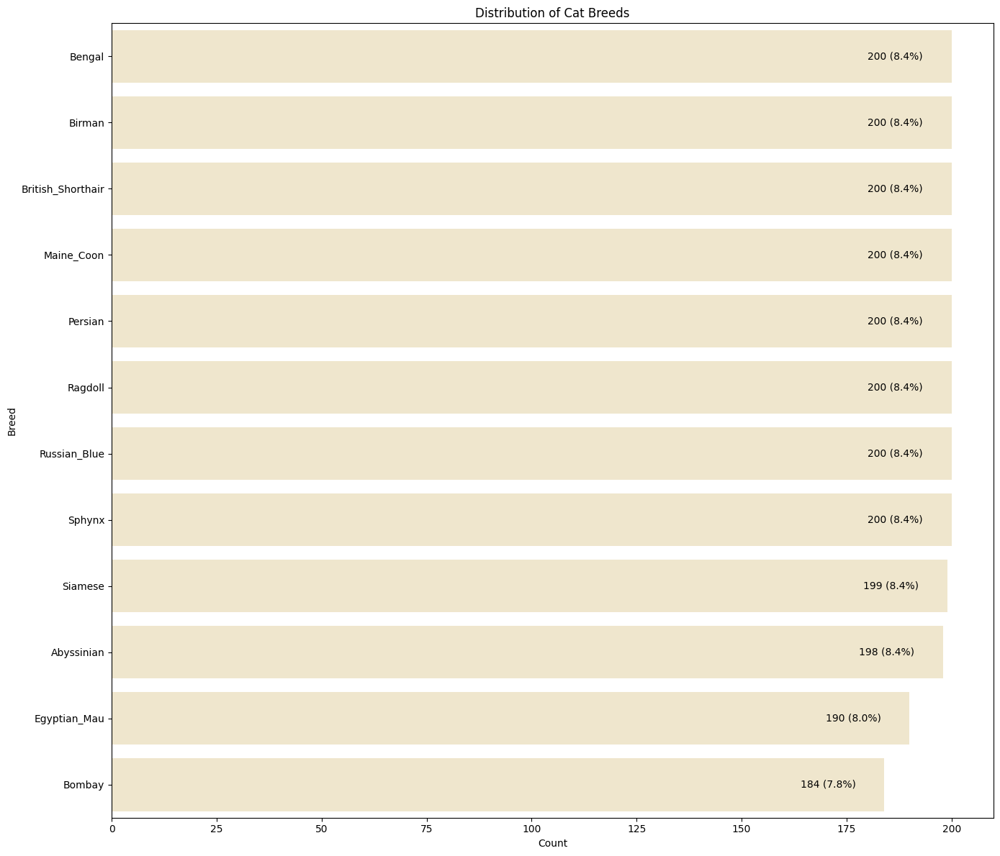

In [16]:
cats = df[df["species_name"] == "Cat"]

plt.figure(figsize=(14,12))
ax = sns.countplot(
    data=cats,
    y="breed_name",
    order=cats["breed_name"].value_counts().index,
    color="#F5E8C7"
)
plt.title("Distribution of Cat Breeds")
plt.xlabel("Count")
plt.ylabel("Breed")

#Bar Annotations
total = len(cats)

for p in ax.patches:
    count = int(p.get_width())
    percent = 100 * count / total
    text = f"{count} ({percent:.1f}%)"
    ax.text(
        p.get_width() - 20,     
        p.get_y() + p.get_height()/2, 
        text,
        va="center"
    )
plt.tight_layout()
plt.show()


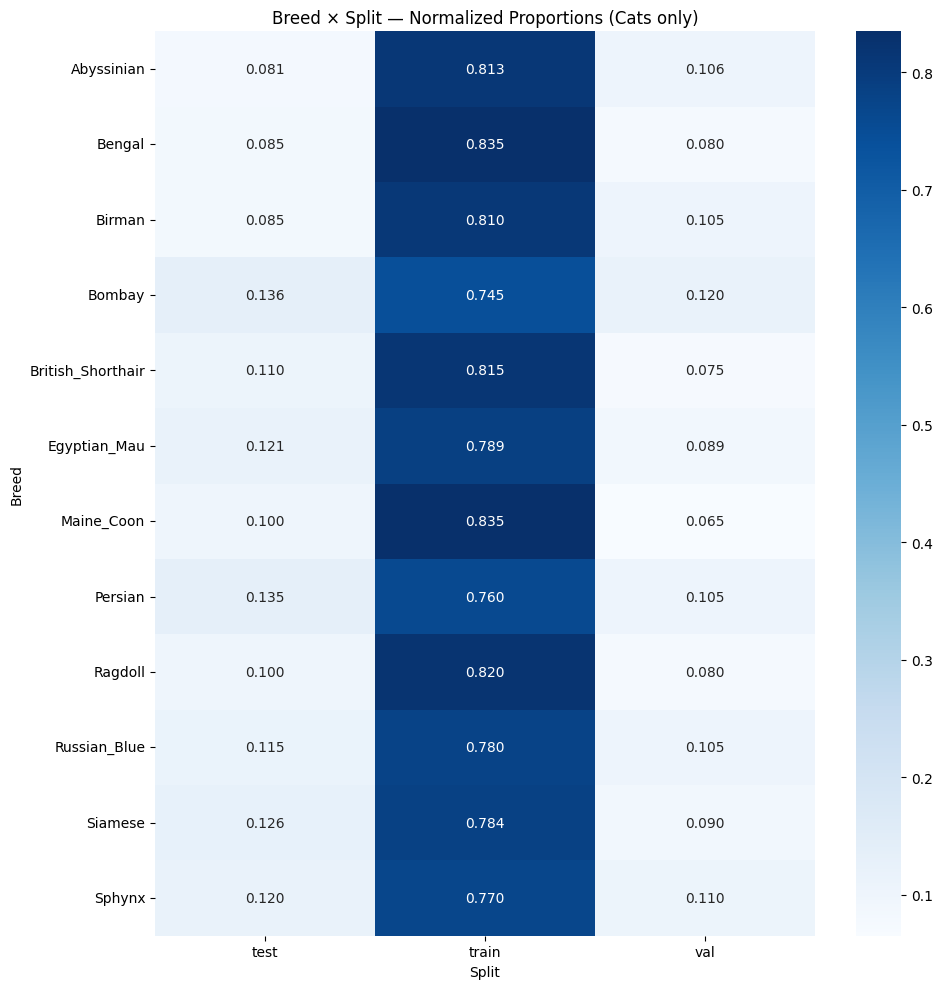

In [17]:
plt.figure(figsize=(10,10))
sns.heatmap(proportion_per_breed.iloc[:12], annot=True, fmt=".3f", cmap="Blues")
plt.title("Breed × Split — Normalized Proportions (Cats only)")
plt.xlabel("Split")
plt.ylabel("Breed")
plt.tight_layout()
plt.show()

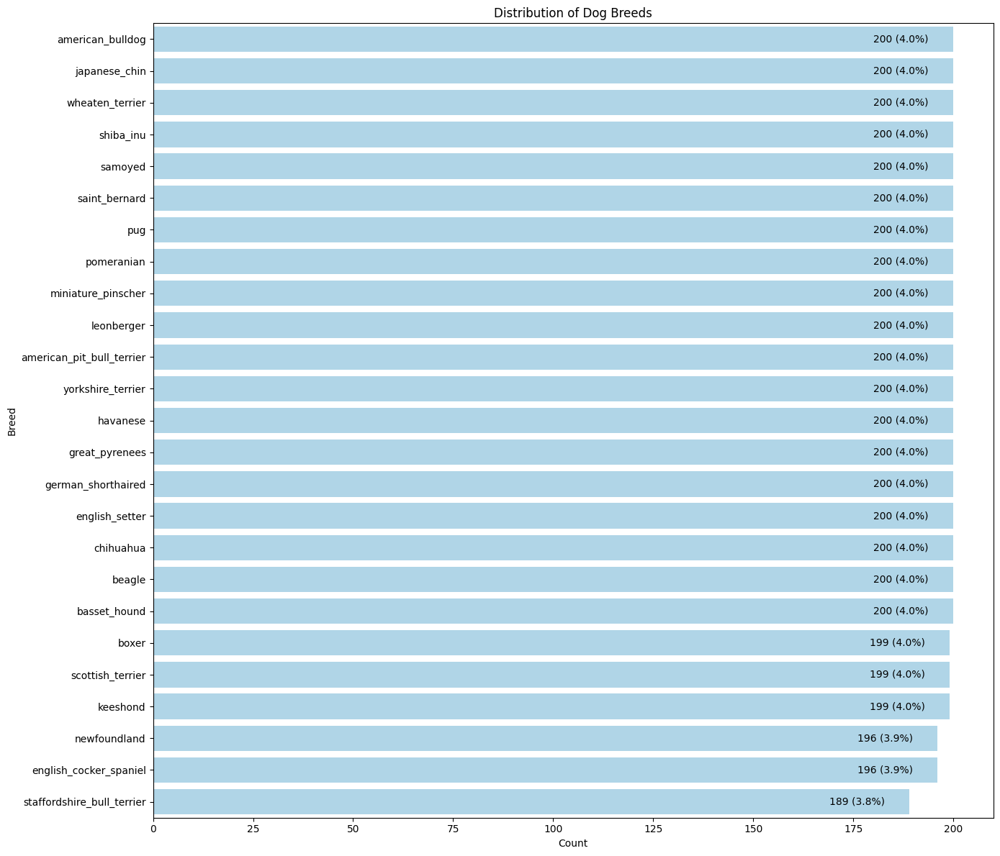

In [18]:
dogs = df[df["species_name"] == "Dog"]

plt.figure(figsize=(14,12))
ax = sns.countplot(
    data=dogs,
    y="breed_name",
    order=dogs["breed_name"].value_counts().index,
    color="#A7D8F0"
)
plt.title("Distribution of Dog Breeds")
plt.xlabel("Count")
plt.ylabel("Breed")

#Bar Annotations
total = len(dogs)

for p in ax.patches:
    count = int(p.get_width())
    percent = 100 * count / total
    text = f"{count} ({percent:.1f}%)"
    ax.text(
        p.get_width() - 20,     
        p.get_y() + p.get_height()/2, 
        text,
        va="center"
    )
plt.tight_layout()
plt.show()


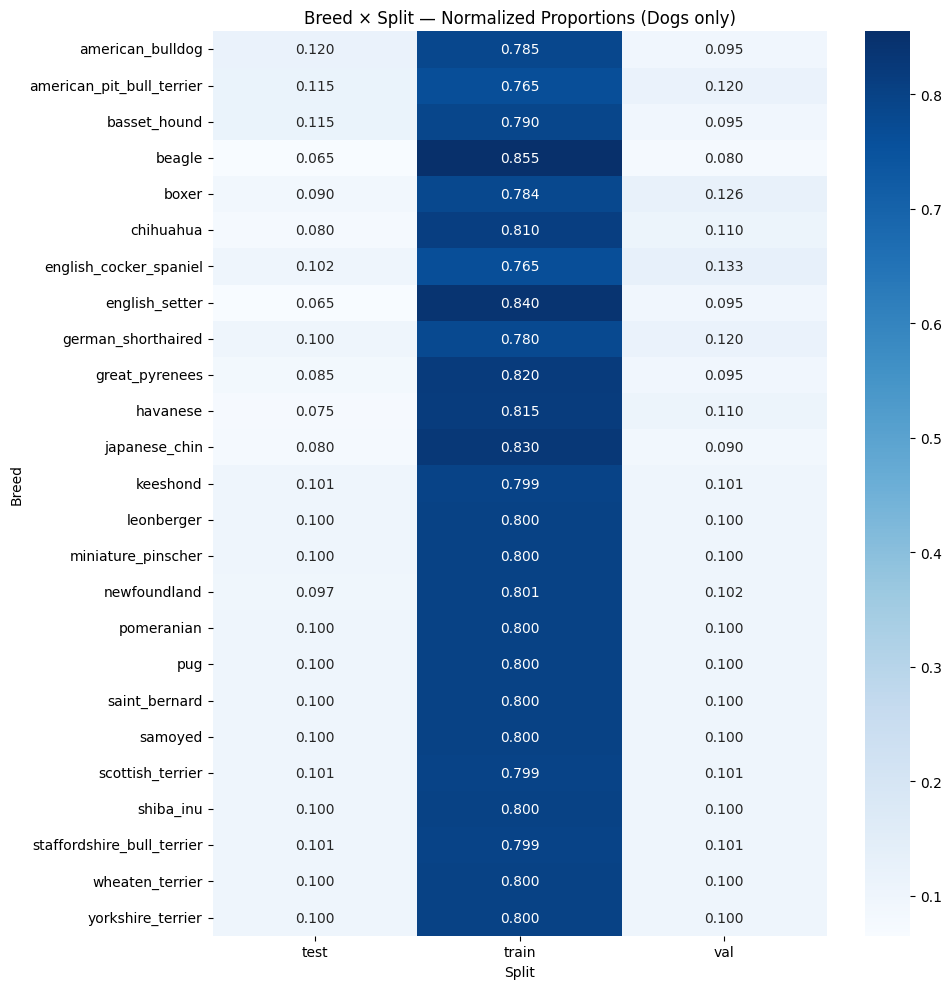

In [19]:
plt.figure(figsize=(10,10))
sns.heatmap(proportion_per_breed.iloc[12:], annot=True, fmt=".3f", cmap="Blues")
plt.title("Breed × Split — Normalized Proportions (Dogs only)")
plt.xlabel("Split")
plt.ylabel("Breed")
plt.tight_layout()
plt.show()

There are 12 breeds of cats and 25 breeds of dogs.

All races have 200 images each, except for :

Cats : 
 - Siameses with 199 images
 - Abyssinians with 198 images
 - Egyptian_Maus with 190 images
 - Bombays with 184 images
 
Dogs : 
 - boxers with 199 images
 - keeshonds with 199 images
 - scottish_terriers with 199 images
 - english_cocker_spaniels with 196 images
 - newfoundlands with 196 images
- staffordshire_bull_terriers with 189 images

### Visualisation of Image, Masks, and Bounding Boxes

#### Image and masks and mask visualisation

The mask and image have the same size


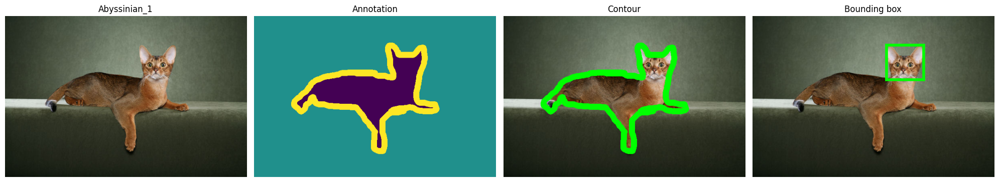

The mask and image have the same size


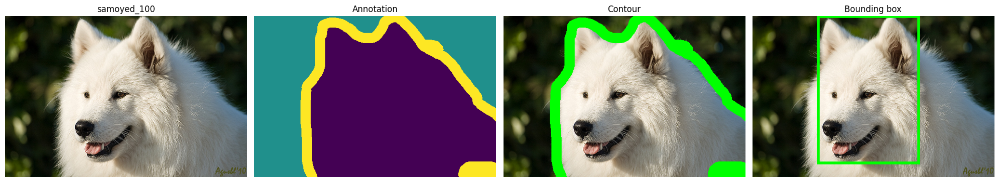

In [20]:
def show_image_mask_bbox(class_id):
    row = df.loc[class_id] if class_id in df.index else df[df["class_id"] == class_id].iloc[0]

    img = Image.open(row["img_path"]).convert("RGB")
    ann = Image.open(row["trimap_path"])

    img_arr = np.array(img)
    ann_arr = np.array(ann)

    if img_arr.shape[:2] == ann_arr.shape[:2]:
        print("The mask and image have the same size")
    else:
        print("Warning: image and mask sizes differ:",
              img_arr.shape[:2], ann_arr.shape[:2])

    #Contour 
    contour = img_arr.copy()
    contour[ann_arr == 3] = [0, 255, 0] # we highlight the contour
    has_xml = not pd.isna(row["xml_path"])
    n_panels = 4 if has_xml else 3

    fig, ax = plt.subplots(1, n_panels, figsize=(5 * n_panels, 5))

    # Original image
    ax[0].imshow(img)
    ax[0].set_title(row["class_id"])
    ax[0].axis("off")

    # Annotation from trimap
    ax[1].imshow(ann_arr, cmap="viridis")
    ax[1].set_title("Annotation")
    ax[1].axis("off")

    # Contour
    ax[2].imshow(contour)
    ax[2].set_title("Contour")
    ax[2].axis("off")

    # Bounding box (if the .xml file exists)
    if has_xml:
        x_min = int(row["bb_xmin"])
        y_min = int(row["bb_ymin"])
        x_max = int(row["bb_xmax"])
        y_max = int(row["bb_ymax"])
        box_w = x_max - x_min
        box_h = y_max - y_min

        ax[3].imshow(img_arr)
        rect = patches.Rectangle(
            (x_min, y_min),
            box_w,
            box_h,
            linewidth=4,
            edgecolor="lime",
            facecolor="none"
        )
        ax[3].add_patch(rect)
        ax[3].set_title("Bounding box")
        ax[3].axis("off")

    plt.tight_layout()
    plt.show()

# Abyssinian_1 has an .xml file
show_image_mask_bbox("Abyssinian_1")

# Abyssinian_1 has an .xml file
show_image_mask_bbox("samoyed_100")


The mask and image have the same size


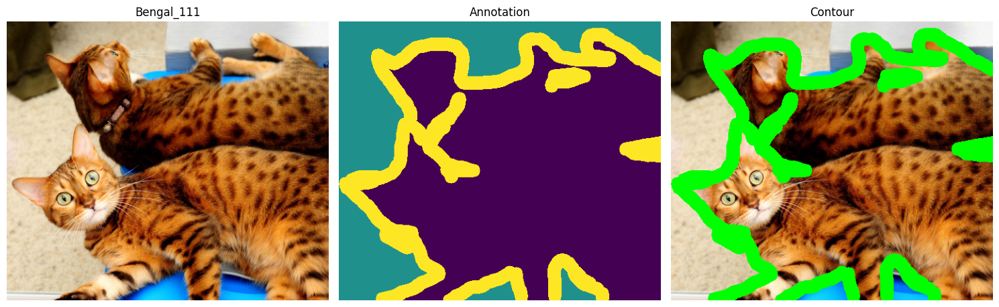

The mask and image have the same size


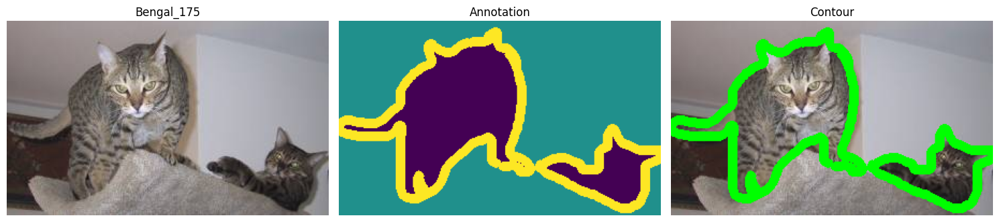

In [21]:
show_image_mask_bbox("Bengal_111")
show_image_mask_bbox("Bengal_175")

- When a trimap is available, it provides information about both the animal and the background.
- The contour may be fully visible in the image (as in Abyssinian_1) or only partially visible (as in samoyed_100).
- Some images contain two animals, and in those cases the trimap may include either a single merged contour (e.g., Bengal_111) or two separate contours (e.g., Bengal_175).
- We also observed that when a bounding box is provided, it typically encloses only the animal's head.

#### Missing bounding boxes

Number of images with missing XML/bounding boxes: 3678
Showing: miniature_pinscher_45
The mask and image have the same size


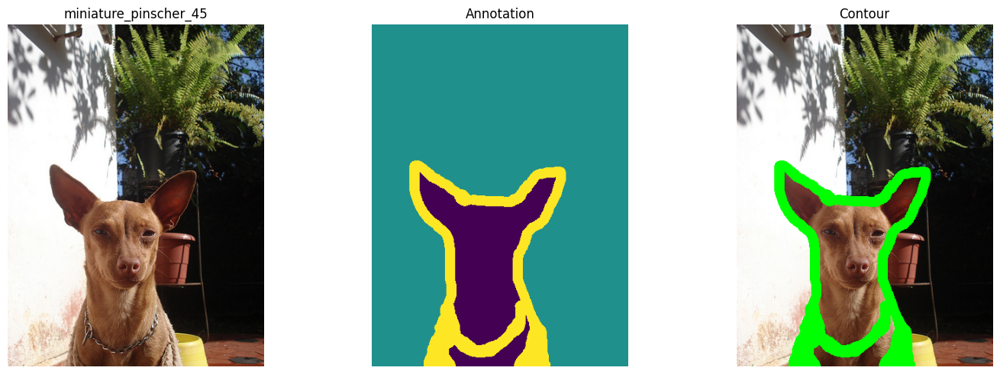

Showing: japanese_chin_58
The mask and image have the same size


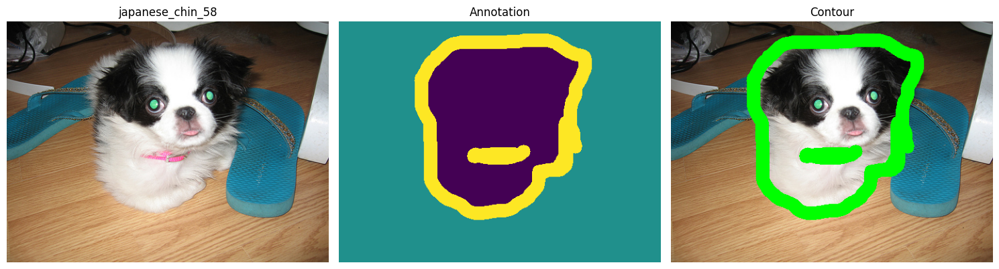

Showing: shiba_inu_85
The mask and image have the same size


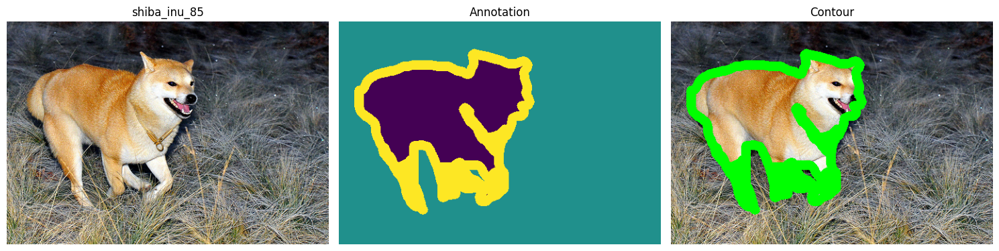

In [22]:
# Missing bounding boxes
missing_xml = df[df["xml_path"].isna()]
num_missing = len(missing_xml)
print(f"Number of images with missing XML/bounding boxes: {num_missing}")

sample_missing = missing_xml.sample(3, random_state=42)
for class_id in sample_missing["class_id"]:
    print(f"Showing: {class_id}")
    show_image_mask_bbox(class_id)


##### Missing trimaps

- We found that 14 images have trimaps containing only a single color.
- This is not an issue for the classification tasks, but these images will be removed before segmentation to avoid introducing bias into the models.

In [23]:
# Missing trimaps 
bad_trimaps = []
for class_id, row in df.iterrows():
    trimap_path = row["trimap_path"]
    ann = Image.open(trimap_path)
    ann_arr = np.array(ann)
    uniq = np.unique(ann_arr)

    if len(uniq) != 3 or not set(uniq).issubset({1, 2, 3}):
        bad_trimaps.append((class_id, uniq))

print("Trimaps with unexpected number of colors:")
for cid, uniq in bad_trimaps:
    print(f"{cid}: unique values = {uniq}")


Trimaps with unexpected number of colors:
saint_bernard_108: unique values = [2]
Egyptian_Mau_162: unique values = [2]
Egyptian_Mau_165: unique values = [2]
Egyptian_Mau_196: unique values = [2]
leonberger_18: unique values = [2]
miniature_pinscher_14: unique values = [2]
saint_bernard_15: unique values = [2]
Egyptian_Mau_20: unique values = [2]
japanese_chin_199: unique values = [2]
keeshond_7: unique values = [2]
Persian_259: unique values = [2]
saint_bernard_60: unique values = [2]
saint_bernard_78: unique values = [2]
wheaten_terrier_195: unique values = [2]


The mask and image have the same size


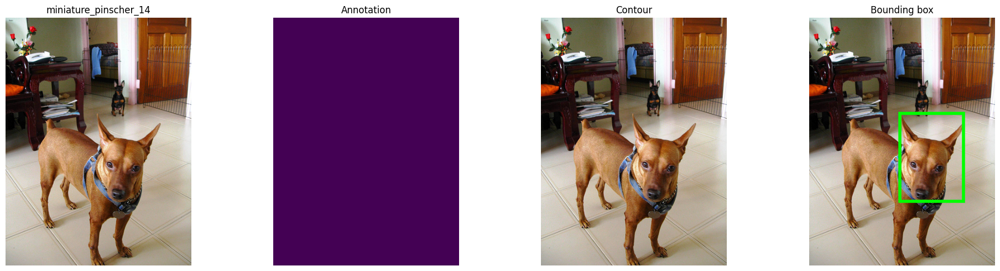

The mask and image have the same size


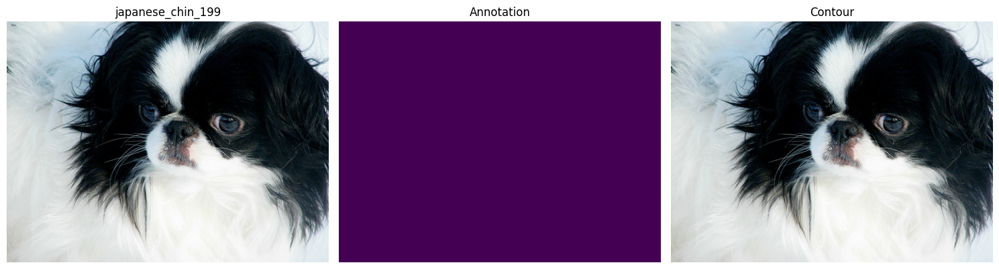

The mask and image have the same size


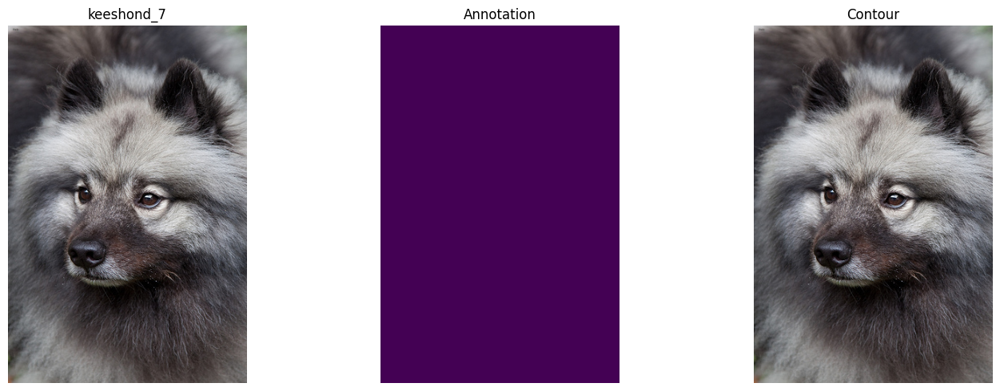

In [24]:
# 3 images with unexpected trimaps
show_image_mask_bbox("miniature_pinscher_14")
show_image_mask_bbox("japanese_chin_199")
show_image_mask_bbox("keeshond_7")


#### Random batches of overlayed images

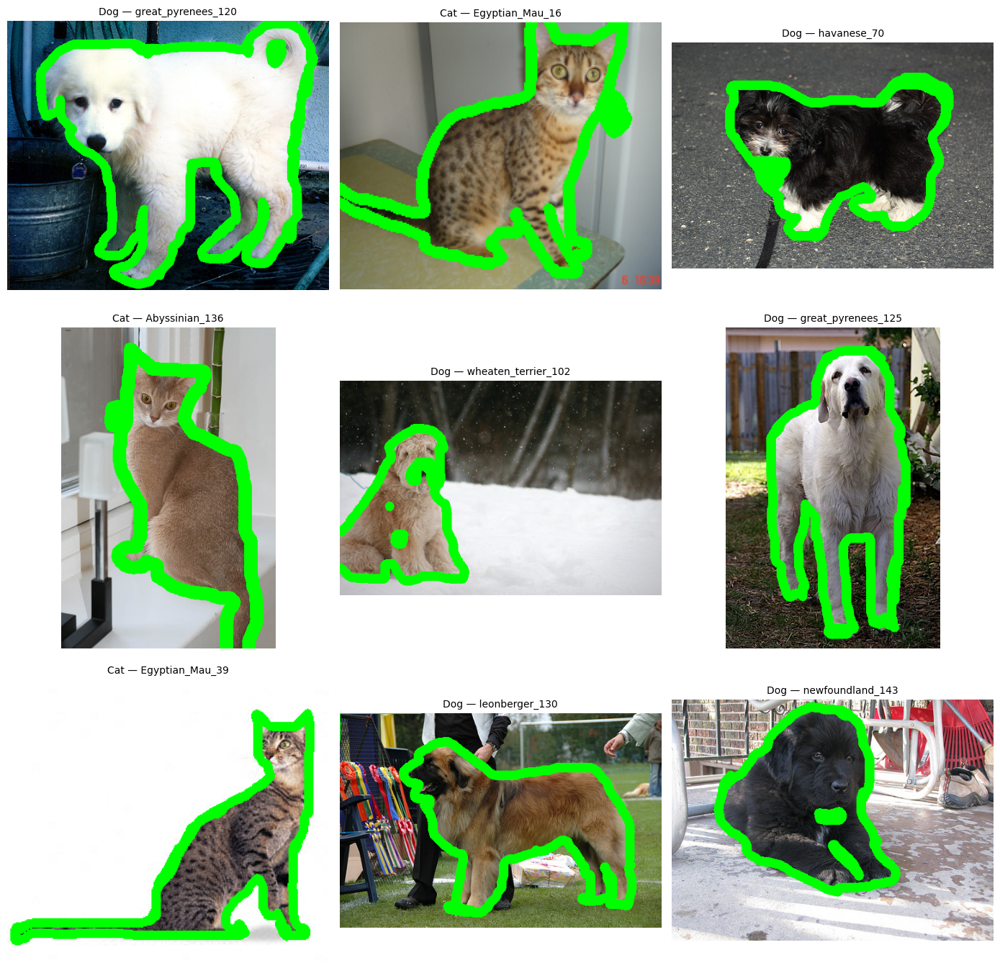

In [25]:
sample_nine = df.sample(9,random_state=-0)
plt.figure(figsize=(14, 14))
for i, (class_id, row) in enumerate(sample_nine.iterrows(), start=1):

    img = Image.open(row["img_path"]).convert("RGB")
    mask = Image.open(row["trimap_path"])

    img_arr = np.array(img)
    mask_arr = np.array(mask)

    overlay = img_arr.copy()
    overlay[mask_arr == 3] = [0, 255, 0] 

    species = row["species_name"].capitalize()    
    breed = row["breed_name"].replace("_", " ").title()   
    title = f"{species} — {class_id}"

    plt.subplot(3, 3, i)
    plt.imshow(overlay)
    plt.title(title, fontsize=10)
    plt.axis("off")

plt.tight_layout()
plt.show()


- We note that some images are taken indoors (e.g., Abyssinian_136), some outdoors (e.g., leonberger_130), and some against a uniform background (e.g., Egyptian_Mau_39).
- From studying the image masks, we have observed that the masking is done very well. No masks are missing and there is no mask and image mismatch. When drawing random images from the database, we see that the masking includes details such as collars, toys and objects that interfere with the animal. 

### Width and Height analysis

- The .xml files provide the width and height, but as they are missing more nearly half of the images, we need to calculate again the width and height for each image, and update the dataframe.

In [26]:
df.drop(columns=["width", "height"])

widths = []
heights = []

for path in df["img_path"]:
    img = Image.open(path)
    w, h = img.size
    widths.append(w)
    heights.append(h)

df["width"] = widths
df["height"] = heights

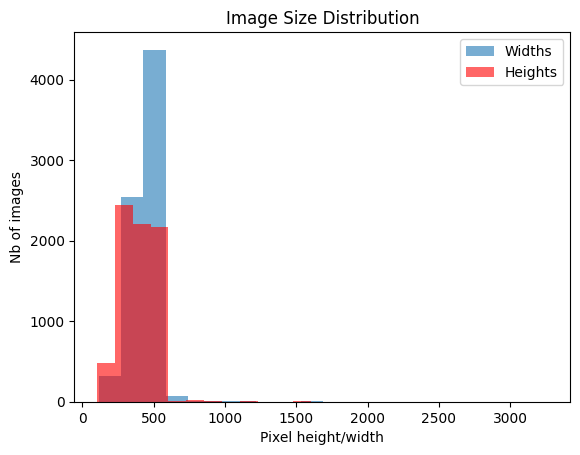

In [27]:
plt.hist(df["width"], bins=20, label= "Widths", alpha= 0.6)
plt.hist(df["height"], bins=20, color = "red", label = "Heights", alpha= 0.6)
plt.title("Image Size Distribution")
plt.xlabel("Pixel height/width")
plt.ylabel("Nb of images")
plt.legend()
plt.show()

In [28]:
# Area (width × height)
area_df = df.dropna(subset=["width", "height"]).copy()

area_df["width"] = area_df["width"].astype(int)
area_df["height"] = area_df["height"].astype(int)

area_df["area"] = area_df["width"] * area_df["height"]
min_area  = area_df["area"].min()
max_area  = area_df["area"].max()
mean_area = area_df["area"].mean()

print(f"Smallest area : {min_area} pixels")
print(f"Largest area  : {max_area} pixels")
print(f"Mean area     : {mean_area:.2f} pixels")


Smallest area : 14111 pixels
Largest area  : 7990272 pixels
Mean area     : 175208.23 pixels


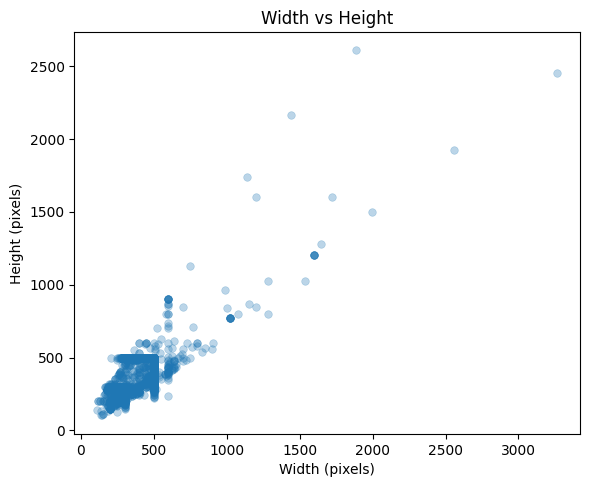

In [29]:
plt.figure(figsize=(6,6))
sns.scatterplot(
    data=df,
    x="width",
    y="height",
    alpha=0.3,
    s=30,
    edgecolor=None
)
plt.title("Width vs Height")
plt.xlabel("Width (pixels)")
plt.ylabel("Height (pixels)")
plt.gca().set_aspect("equal", adjustable="box")
plt.tight_layout()
plt.show()

In [30]:
df.groupby(["width", "height"]).size().sort_values(ascending=False).head(20)

width  height
500    375       1424
       333       1069
375    500        511
333    500        509
300    225        261
500    334        250
       332        185
334    500        151
500    335         97
332    500         91
500    500         88
335    500         53
225    300         49
500    400         39
       281         29
       330         28
       376         27
400    500         27
500    374         27
357    500         26
dtype: int64

- We observe that the size of the images vary significantly. We will have to normalise the image size before training our models in the next sections. 

We will now study bias of the images. Perhaps some breeds are more often photographed outside rather than inside. There could possibly be more background compared to foreground from some breeds as well. The lightning of the images could also differ from breed to breed or between dogs and cats. For this reason, we will study: 

- The average colour of the images per species and breed
- The average green intensity per species and breed
- The foreground ratio per species and breed

### Brightness

In [31]:
df["avg_brightness"] = df["class_id"].apply(
    lambda name: np.array(Image.open(f"{PATH_TO_IMG}{name}.jpg").convert("L")).mean()
)



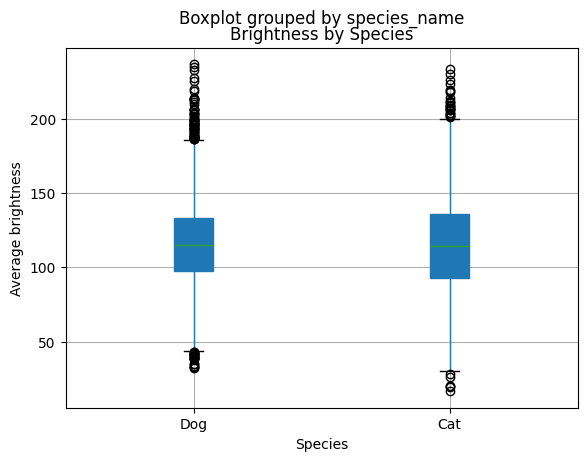

In [32]:
order_label_specie = (
    df.groupby("species_name")["avg_brightness"]
      .median()
      .sort_values(ascending=False)
      .index
)

df["species_name"] = pd.Categorical(df["species_name"],categories=order_label_specie,ordered=True)

df.boxplot(column="avg_brightness",by="species_name",patch_artist=True)

plt.title("Brightness by Species")
plt.xlabel("Species")
plt.ylabel("Average brightness")
plt.show()


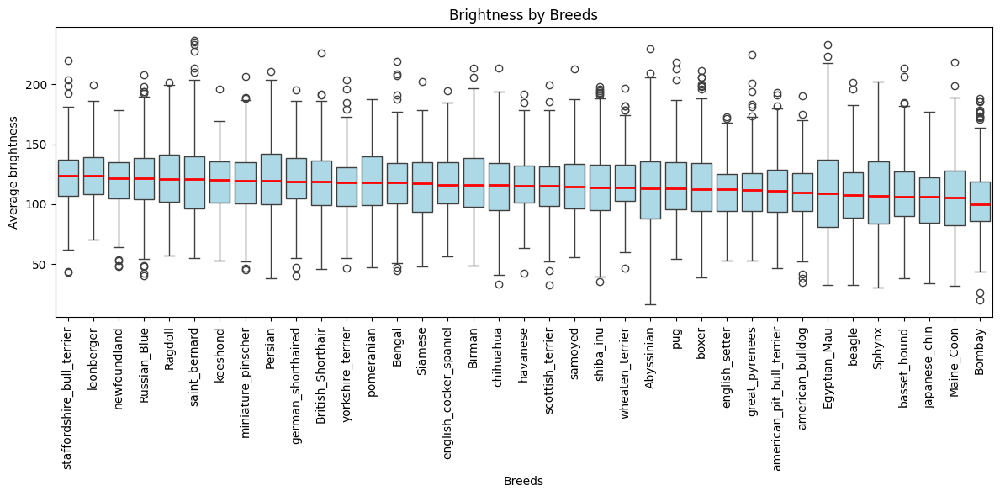

In [33]:
order_label_breed = (
    df.groupby("breed_name")["avg_brightness"]
      .median()
      .sort_values(ascending=False)
      .index
)

plt.figure(figsize=(12, 6))

sns.boxplot(
    data=df,
    x="breed_name",
    y="avg_brightness",
    order=order_label_breed,
    showcaps=True,
    boxprops={"facecolor":"lightblue"},
    medianprops={"color":"red", "linewidth":2},
)

plt.title("Brightness by Breeds")
plt.xlabel("Breeds")
plt.ylabel("Average brightness")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


### Green level

In [34]:
def average_green_level(image_name):
    img_path = f"{PATH_TO_IMG}/{image_name}.jpg"
    img = np.array(Image.open(img_path))
    return img[:, :, 1].mean()     # channel 1 = green

df["avg_green"] = df["class_id"].apply(average_green_level)

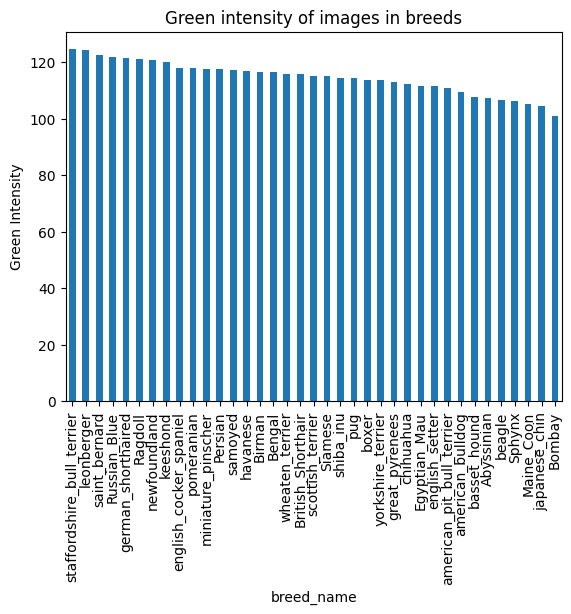

In [35]:
df.groupby("breed_name")["avg_green"].mean().nlargest(37).plot(kind="bar")
plt.title("Green intensity of images in breeds")
plt.ylabel("Green Intensity")
plt.show()

/var/folders/s3/2zd0r2816f51q8xhcynm5c2h0000gn/T/ipykernel_71142/979340843.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby("species_name")["avg_green"].mean().plot(kind="bar")


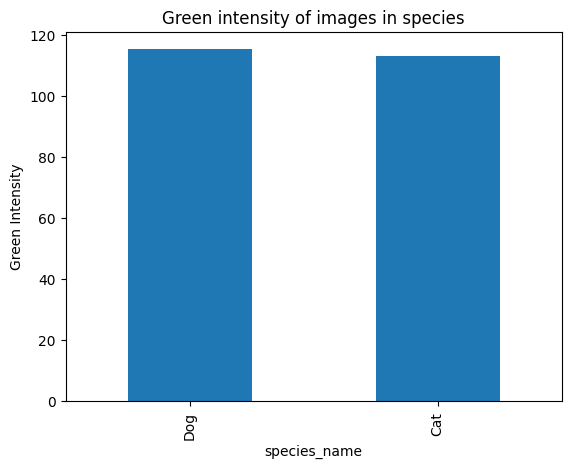

In [36]:
df.groupby("species_name")["avg_green"].mean().plot(kind="bar")
plt.title("Green intensity of images in species")
plt.ylabel("Green Intensity")
plt.show()

### Foreground ratio

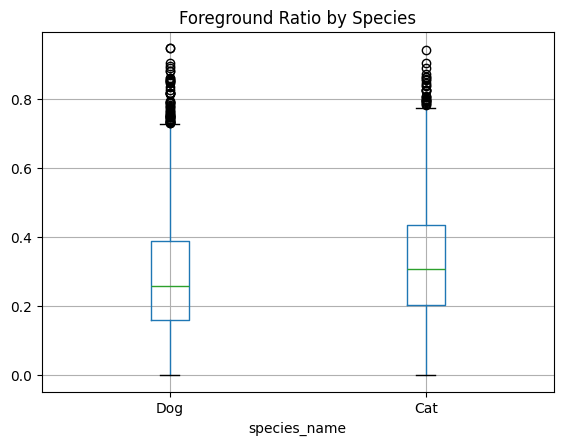

In [37]:
foreground_ratios = []

for _, row in df.iterrows():
    mask_file = f"{row['class_id']}.png"
    mask = np.array(Image.open(f"{PATH_TO_TRIMAPS}/{mask_file}"))
    fg_ratio = (mask == 1).mean()
    foreground_ratios.append(fg_ratio)

df["fg_ratio"] = foreground_ratios

df.boxplot(column="fg_ratio", by="species_name")
plt.title("Foreground Ratio by Species")
plt.suptitle("")
plt.show()

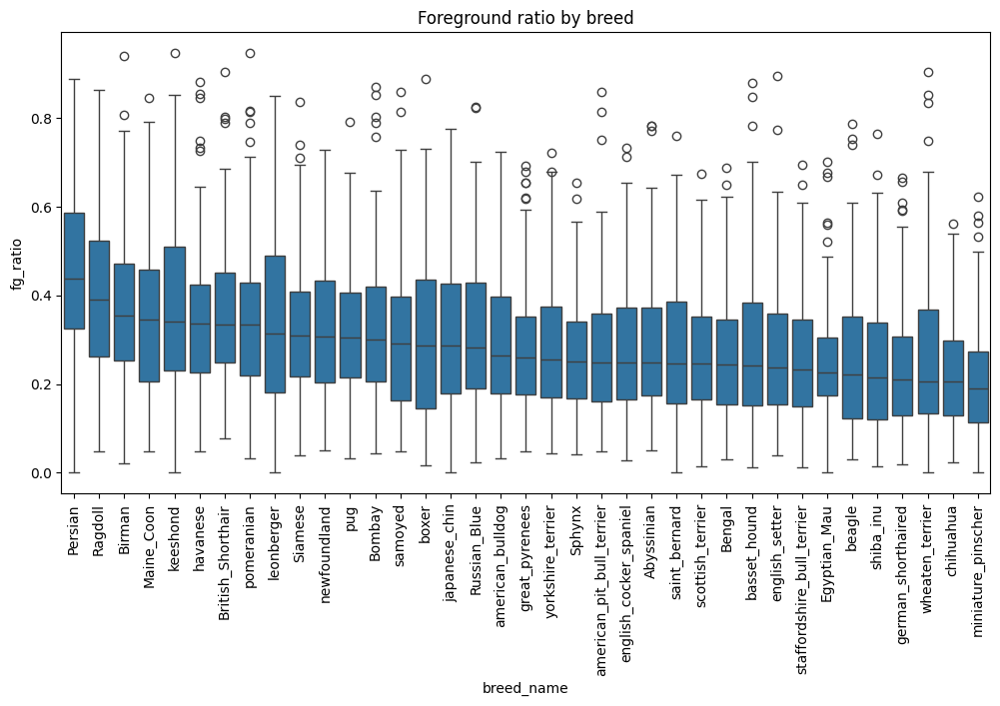

In [38]:
order_label_breed_fg = (
    df.groupby("breed_name")["fg_ratio"].median().sort_values(ascending=False).index
)

plt.figure(figsize=(12, 6))
sns.boxplot(
    data=df,
    x="breed_name",
    y="fg_ratio",
    order=order_label_breed_fg
)

plt.title("Foreground ratio by breed")
plt.xticks(rotation=90)
plt.show()

### Conclusion of the Exploratory Data Analysis

Overall comments on first part. 
Because of this, we will normalise the images by size and colour. We will keep the observed biases in mind when analysing the final results. 

-----

### Dataset construction

In [39]:
IMG_SIZE = 224
IMAGE_NET_MEAN = [0.485, 0.456, 0.406]
IMAGE_NET_STD = [0.229, 0.224, 0.225]

In [40]:
train_df = df[df["new_split"] == "train"].reset_index(drop=True)
val_df   = df[df["new_split"] == "val"].reset_index(drop=True)
test_df  = df[df["new_split"] == "test"].reset_index(drop=True)
print(len(train_df), len(val_df), len(test_df))


5879 735 735


In [41]:
class PetDataset(Dataset):
    def __init__(self, df, task="binary", transform=None):
        """
        task = "binary" (0=cat, 1=dog) (binary classification)
        task = "multiclass"   (0..36) (multiclass classification)
        task = "segmentation" (returns mask + image)
        """
        self.df = df
        self.task = task
        self.transform = transform
        
        # To remove the 14 images without trimaps when doing segmentation
        if task == "segmentation":
            self.df = self.df[self.df["trimap_path"].notna()].reset_index(drop=True)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        image = Image.open(row["img_path"]).convert("RGB")

        if self.task == "binary":
            label = row["species"]    # 0=cat, 1=dog

        elif self.task == "multiclass":
            label = row["breed_id"]   # 0..36

        elif self.task == "segmentation":
            mask = Image.open(row["trimap_path"])
            if self.transform:
                transformed = self.transform(image=np.array(image), mask=np.array(mask))
                return transformed["image"], transformed["mask"]
            return np.array(image), np.array(mask)

        # Transformation (for classification only)
        if self.transform:
            image = self.transform(image)

        return image, label
    


### Default classification tranform

In [42]:
train_transform = T.Compose([
    T.Resize((IMG_SIZE,IMG_SIZE)),
    T.ToTensor(),
    T.Normalize(mean = IMAGE_NET_MEAN,
                std = IMAGE_NET_STD),
])

val_transform = T.Compose([
    T.Resize((IMG_SIZE,IMG_SIZE)),
    T.ToTensor(),
    T.Normalize(mean = IMAGE_NET_MEAN,
                std = IMAGE_NET_STD),
])

### Default classification tranform

In [43]:
# to be determined

### Binary classification instantiation

In [44]:
train_bininary_clf = PetDataset(train_df, task="binary", transform=train_transform)
val_bininary_clf  = PetDataset(val_df, task="binary", transform=val_transform)
test_bininary_clf  = PetDataset(test_df, task="binary", transform=val_transform)

In [45]:
train_loader_binary_clf = DataLoader(train_bininary_clf, batch_size=32, shuffle=True,  num_workers=0)
val_loader_binary_clf   = DataLoader(val_bininary_clf,   batch_size=32, shuffle=False, num_workers=0)

### Multiclass classification instantiation

In [46]:
train_multi_clf = PetDataset(train_df, task="multiclass", transform=train_transform)
val_multi_clf   = PetDataset(val_df, task="multiclass", transform=val_transform)
test_multi_clf  = PetDataset(test_df, task="multiclass", transform=val_transform)


### Segmentation instantiation

In [47]:
# to be determined

### Functions

In [48]:
def plot_train_val_loss(history):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(12, 10))
    plt.plot(epochs, history["train_loss"], label="Train Loss")
    plt.plot(epochs, history["val_loss"], label="Validation Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss Curve")
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_accuracy(history):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(12, 10))
    plt.plot(epochs, history["train_acc"], label="Train Accuracy")
    plt.plot(epochs, history["val_acc"], label="Validation Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title("Accuracy")
    plt.legend()
    plt.tight_layout()
    plt.show()

def classification_metrics(y_true,y_prob,threshold=0.5):
    y_pred = (y_prob >= threshold).astype(int) #binarize probs

    cm = confusion_matrix(y_true,y_pred)
    report = classification_report(y_true,y_pred,target_names=["Cat","Dog"],digits=3)

    roc_auc = roc_auc_score(y_true, y_prob)

    precision, recall, pr_thresholds = precision_recall_curve(y_true,y_prob)

    ap = average_precision_score(y_true, y_prob)

    return {
        "confusion_matrix": cm,
        "classification_report": report,
        "roc_auc": roc_auc,
        "precision": precision,
        "recall": recall,
        "pr_thresholds": pr_thresholds,
        "average_precision": ap,
    }

def plot_binary_confusion_matrix(cm, class_names=("Cat", "Dog"), title="Confusion Matrix"):
    plt.figure(figsize=(8,8))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=class_names,
        yticklabels=class_names
    )
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(title)
    plt.tight_layout()
    plt.show()

def plot_roc_curve(y_true, y_prob, title="ROC Curve"):
    fpr, tpr, thresholds = roc_curve(y_true, y_prob)

    plt.figure(figsize=(8,8))
    plt.plot(fpr, tpr, label="ROC")
    plt.plot([0, 1], [0, 1], "k--", label="Random")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_pr_curve(y_true, y_prob, title="Precision–Recall Curve"):
    precision, recall, thresholds = precision_recall_curve(y_true, y_prob)
    ap = average_precision_score(y_true, y_prob)

    plt.figure(figsize=(8,8))
    plt.plot(recall, precision, label=f"PR (AP={ap:.3f})")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()


In [49]:
def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()
    total_loss, correct, total = 0, 0, 0

    for imgs, labels in tqdm(loader, desc="Training", leave=False):
        imgs, labels = imgs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * imgs.size(0)
        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return total_loss / total, correct / total


def evaluate(model, loader, criterion, device):
    model.eval()
    total_loss, correct, total = 0, 0, 0
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for imgs, labels in tqdm(loader, desc="Validating", leave=False):
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            loss = criterion(outputs, labels)

            total_loss += loss.item() * imgs.size(0)

            probs = F.softmax(outputs, dim=1)[:, 1]  # probability of class "1" (dog)
            preds = outputs.argmax(dim=1)

            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_labels.append(labels.cpu().numpy())
            all_probs.append(probs.cpu().numpy())

    avg_loss = total_loss / total
    acc = correct / total

    all_labels = np.concatenate(all_labels)
    all_probs = np.concatenate(all_probs)

    return avg_loss, acc, all_labels, all_probs


In [50]:
def denormalize_image(tensor):
    """Undo normalization so we can display the image."""
    img = tensor.cpu().numpy().transpose(1,2,0)
    img = img * IMAGE_NET_STD + IMAGE_NET_MEAN
    img = np.clip(img, 0, 1)
    return img

def show_random_binary_classif_predictions(model, dataset, device, num_images=9):
    model.eval()

    indices = random.sample(range(len(dataset)), num_images)

    plt.figure(figsize=(12, 12))

    for i, idx in enumerate(indices):
        # if your dataset returns (img, label, path) this will need to change to: img, label, img_path = dataset[idx]
        img, label = dataset[idx]         
        img_tensor = img.unsqueeze(0).to(device)

        with torch.no_grad():
            logits = model(img_tensor)
            probs = F.softmax(logits, dim=1)[0]   # [p_cat, p_dog]
            pred = torch.argmax(probs).item()

        img_vis = denormalize_image(img)

        plt.subplot(3, 3, i + 1)
        plt.imshow(img_vis)
        plt.axis("off")

        prob_cat = probs[0].item()
        prob_dog = probs[1].item()

        pred_name = "Dog" if pred == 1 else "Cat"
        true_name = "Dog" if label == 1 else "Cat"

        title = (
            f"Pred: {pred_name}\n"
            f"P_cat={prob_cat:.2f}, P_dog={prob_dog:.2f}\n"
            f"True: {true_name}"
        )

        plt.title(title, fontsize=10)

    plt.tight_layout()
    plt.show()


## 2 - Binary (Species) Classification

### Plan

- [En cours] Simple CNN sans augmentation, sans ré-équilibrage des classes dans la loss
- [To do] Simple CNN sans augmentation, avec ré-équilibrage des classes dans la loss
- [To do] Simple CNN avec augmentation (avec ré-équilibrage directement ?) (--> à voir en fonction des résultats précedents)
- [To do] Modèle pré-entraîné sans augmentation (avec ré-équilibrage directement ?) (--> à voir en fonction des résultats précedents)
- [To do] Modèle pré-entraîné avec augmentation (avec ré-équilibrage directement ?) (--> à voir en fonction des résultats précedents)

- Justifier choix optimizer, loss, hyperparameteres
- Présenter les metrique à utiliser
- Confusion matrix
- Visualiser les loss (fixer 30 epochs ?)
- Visualiser les bonnes prédictions, les erreurs
- (si le temps) : Grad-CAM sur quelques images ?

### 2.1 - Binary Classification : CNN, Without augmentation

In [51]:
class CNN_V1(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(256, 512, kernel_size=3, padding=1)

        self.pool = nn.MaxPool2d(2, 2)
        self.dropout = nn.Dropout(0.2)

        self.bn1 = nn.BatchNorm2d(64)
        self.bn2 = nn.BatchNorm2d(128)
        self.bn3 = nn.BatchNorm2d(256)
        self.bn4 = nn.BatchNorm2d(512)

        self.fc1 = nn.Linear(512, 512)
        self.gap = nn.AdaptiveAvgPool2d((1, 1)) #global average pooling
        self.fc2 = nn.Linear(512, 2)  # binary classif

    def forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))  # 224 -> 112
        x = self.pool(F.relu(self.bn2(self.conv2(x))))  # 112 -> 56
        x = self.pool(F.relu(self.bn3(self.conv3(x))))  # 56 -> 28
        x = self.pool(F.relu(self.bn4(self.conv4(x))))  # 28 --> 14

        x = self.gap(x) # [B, 512, 1, 1]                       
        x = x.view(x.size(0), -1) # [B, 512]            
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)
        return x

#### 2.1.1 - Binary Classification : CNN, Without augmentation, No Class Weight

##### Training

In [52]:
device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}") # mps is for macs with Apple Silicon

model_cnn_noaug_noclassweight = CNN_V1().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model_cnn_noaug_noclassweight.parameters(), lr=1e-4, weight_decay=1e-4)

Using device: mps


In [53]:
history_cnn_noaug_noclassweight = {
    "train_loss": [],
    "train_acc": [],
    "val_loss": [],
    "val_acc": [],
}

for epoch in range(30):
    train_loss, train_acc = train_one_epoch(
        model_cnn_noaug_noclassweight,
        train_loader_binary_clf,
        optimizer, criterion, device
    )
    
    val_loss, val_acc, y_true, y_prob = evaluate(
        model_cnn_noaug_noclassweight,
        val_loader_binary_clf,
        criterion, device
    )


    history_cnn_noaug_noclassweight["train_loss"].append(train_loss)
    history_cnn_noaug_noclassweight["train_acc"].append(train_acc)
    history_cnn_noaug_noclassweight["val_loss"].append(val_loss)
    history_cnn_noaug_noclassweight["val_acc"].append(val_acc)


    print(f"Epoch {epoch+1}: "
          f"Train Loss={train_loss:.4f}, Train Acc={train_acc:.3f} | "
          f"Val Loss={val_loss:.4f}, Val Acc={val_acc:.3f}")

# Final eval, after training
val_loss, val_acc, last_y_true, last_y_prob = evaluate(
        model_cnn_noaug_noclassweight,
        val_loader_binary_clf,
        criterion, device
    )

y_true, y_prob = last_y_true, last_y_prob
metrics_cnn_noaug_noclassweight = classification_metrics(y_true,y_prob)

Epoch 1: Train Loss=0.5976, Train Acc=0.680 | Val Loss=0.5780, Val Acc=0.703


Epoch 2: Train Loss=0.5780, Train Acc=0.692 | Val Loss=0.5563, Val Acc=0.717


Epoch 3: Train Loss=0.5610, Train Acc=0.707 | Val Loss=0.5516, Val Acc=0.740


Epoch 4: Train Loss=0.5516, Train Acc=0.715 | Val Loss=0.5369, Val Acc=0.731


Epoch 5: Train Loss=0.5372, Train Acc=0.719 | Val Loss=0.5781, Val Acc=0.693


Epoch 6: Train Loss=0.5210, Train Acc=0.739 | Val Loss=0.6207, Val Acc=0.712


Epoch 7: Train Loss=0.5060, Train Acc=0.748 | Val Loss=0.5516, Val Acc=0.699


Epoch 8: Train Loss=0.4880, Train Acc=0.764 | Val Loss=0.4862, Val Acc=0.759


Epoch 9: Train Loss=0.4750, Train Acc=0.776 | Val Loss=0.6174, Val Acc=0.736


Epoch 10: Train Loss=0.4607, Train Acc=0.782 | Val Loss=0.6589, Val Acc=0.739


Epoch 11: Train Loss=0.4381, Train Acc=0.799 | Val Loss=0.6010, Val Acc=0.754


Epoch 12: Train Loss=0.4060, Train Acc=0.821 | Val Loss=0.4507, Val Acc=0.792


Epoch 13: Train Loss=0.3930, Train Acc=0.825 | Val Loss=0.4504, Val Acc=0.792


Epoch 14: Train Loss=0.3816, Train Acc=0.834 | Val Loss=0.4615, Val Acc=0.778


Epoch 15: Train Loss=0.3621, Train Acc=0.847 | Val Loss=1.0464, Val Acc=0.494


Epoch 16: Train Loss=0.3488, Train Acc=0.846 | Val Loss=0.4541, Val Acc=0.790


Epoch 17: Train Loss=0.3294, Train Acc=0.857 | Val Loss=0.4176, Val Acc=0.829


Epoch 18: Train Loss=0.3139, Train Acc=0.863 | Val Loss=0.9542, Val Acc=0.732


Epoch 19: Train Loss=0.3049, Train Acc=0.872 | Val Loss=0.7272, Val Acc=0.695


Epoch 20: Train Loss=0.2849, Train Acc=0.881 | Val Loss=0.4330, Val Acc=0.820


Epoch 21: Train Loss=0.2749, Train Acc=0.883 | Val Loss=0.5246, Val Acc=0.801


Epoch 22: Train Loss=0.2573, Train Acc=0.891 | Val Loss=0.5002, Val Acc=0.810


Epoch 23: Train Loss=0.2440, Train Acc=0.902 | Val Loss=0.7929, Val Acc=0.751


Epoch 24: Train Loss=0.2316, Train Acc=0.904 | Val Loss=0.8831, Val Acc=0.743


Epoch 25: Train Loss=0.2132, Train Acc=0.916 | Val Loss=0.3958, Val Acc=0.834


Epoch 26: Train Loss=0.2113, Train Acc=0.916 | Val Loss=0.5701, Val Acc=0.752


Epoch 27: Train Loss=0.2033, Train Acc=0.915 | Val Loss=0.4122, Val Acc=0.850


Epoch 28: Train Loss=0.1905, Train Acc=0.922 | Val Loss=1.9108, Val Acc=0.471


Epoch 29: Train Loss=0.1870, Train Acc=0.926 | Val Loss=0.3500, Val Acc=0.861


Epoch 30: Train Loss=0.1661, Train Acc=0.933 | Val Loss=0.3793, Val Acc=0.848


##### Save model weights, training info

In [54]:
import os
import json
import numpy as np
import pandas as pd
import torch

# =========================
# SAVE PHASE (run after training + evaluation)
# =========================

save_dir = "model_outputs/cnn_noaug_noclassweight"
os.makedirs(save_dir, exist_ok=True)

# 1) Save model weights
model_path_cnn_noaug_noclassweight = os.path.join(
    save_dir, "cnn_noaug_noclassweight_model_weights.pth"
)
torch.save(model_cnn_noaug_noclassweight.state_dict(), model_path_cnn_noaug_noclassweight)
print(f"✅ Model weights saved to: {model_path_cnn_noaug_noclassweight}")

# 2) Save training history (dict -> CSV)
history_cnn_noaug_noclassweight_df = pd.DataFrame(history_cnn_noaug_noclassweight)
history_cnn_noaug_noclassweight_df.to_csv(
    os.path.join(save_dir, "training_history.csv"), index=False
)
print("✅ Training history saved to training_history.csv")

# 3) Save predictions for ROC/PR/etc.
np.save(os.path.join(save_dir, "y_true.npy"), y_true)
np.save(os.path.join(save_dir, "y_prob.npy"), y_prob)
print("✅ y_true.npy and y_prob.npy saved")

# 4) Save scalar metrics + classification report (JSON)
metrics_json = {
    "roc_auc": float(metrics_cnn_noaug_noclassweight["roc_auc"]),
    "average_precision": float(metrics_cnn_noaug_noclassweight["average_precision"]),
    "classification_report": metrics_cnn_noaug_noclassweight["classification_report"],
}
with open(os.path.join(save_dir, "metrics.json"), "w") as f:
    json.dump(metrics_json, f, indent=4)
print("✅ metrics.json saved")

# 5) Save confusion matrix separately as .npy
np.save(
    os.path.join(save_dir, "confusion_matrix.npy"),
    metrics_cnn_noaug_noclassweight["confusion_matrix"],
)
print("✅ confusion_matrix.npy saved")



✅ Model weights saved to: model_outputs/cnn_noaug_noclassweight/cnn_noaug_noclassweight_model_weights.pth
✅ Training history saved to training_history.csv
✅ y_true.npy and y_prob.npy saved
✅ metrics.json saved
✅ confusion_matrix.npy saved


##### Results (Losses & Metrics)

✅ Model weights reloaded

=== Classification report ===
              precision    recall  f1-score   support

         Cat      0.709     0.843     0.770       223
         Dog      0.926     0.850     0.886       512

    accuracy                          0.848       735
   macro avg      0.817     0.846     0.828       735
weighted avg      0.860     0.848     0.851       735

ROC AUC: 0.9242222533632287
AP (PR AUC): 0.9639943109983686


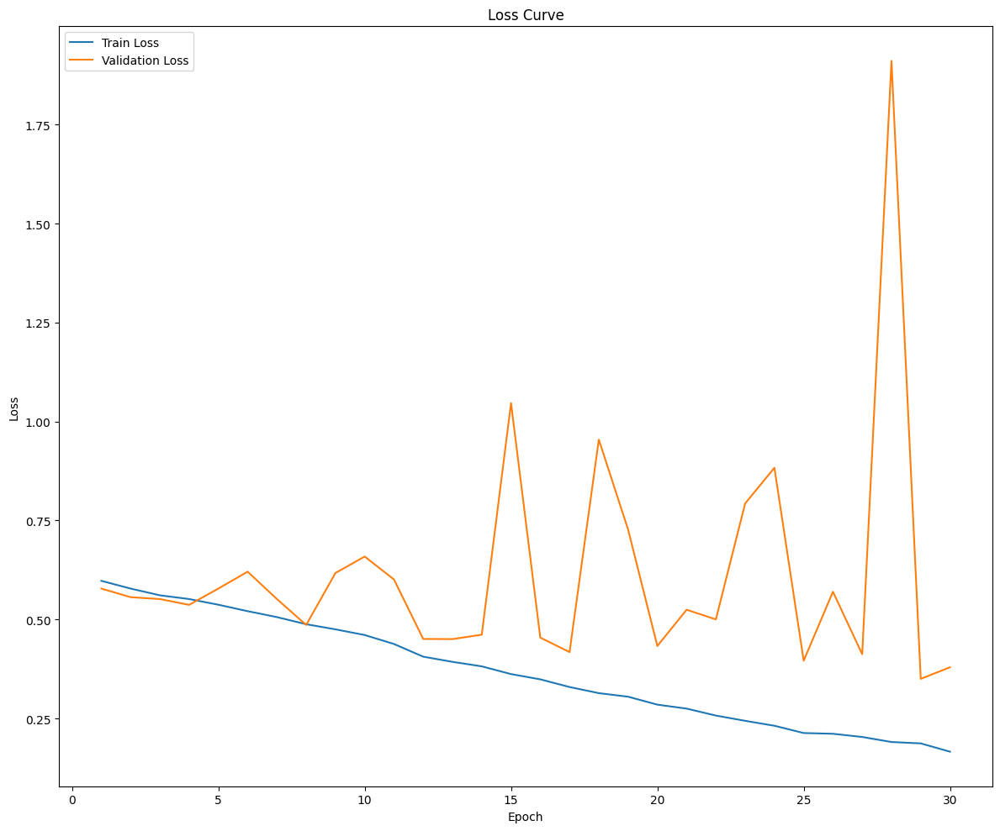

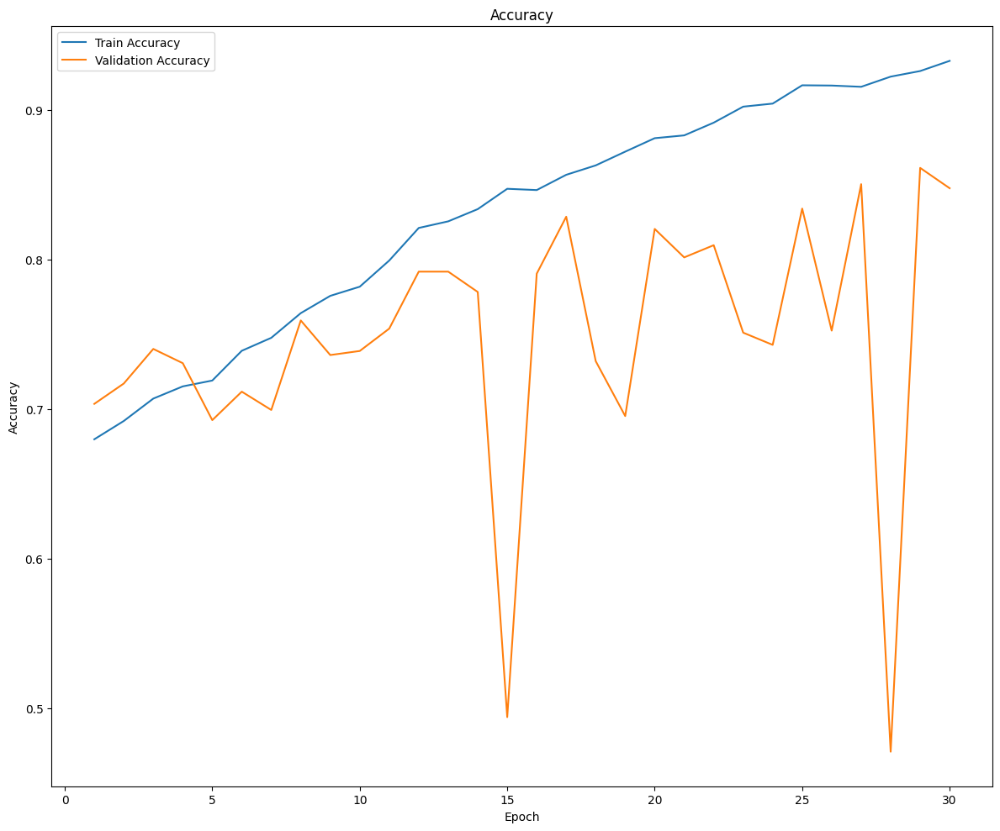

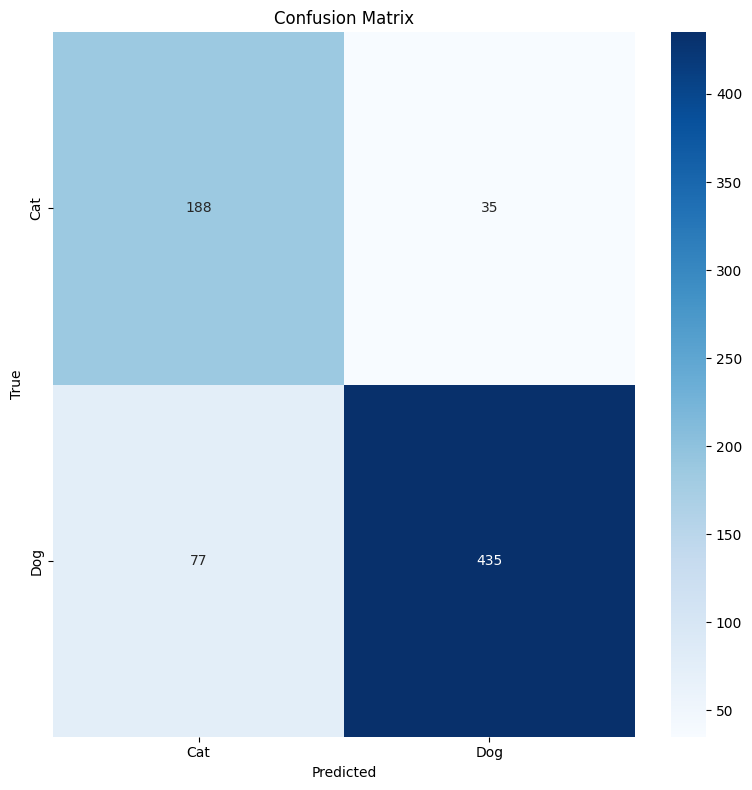

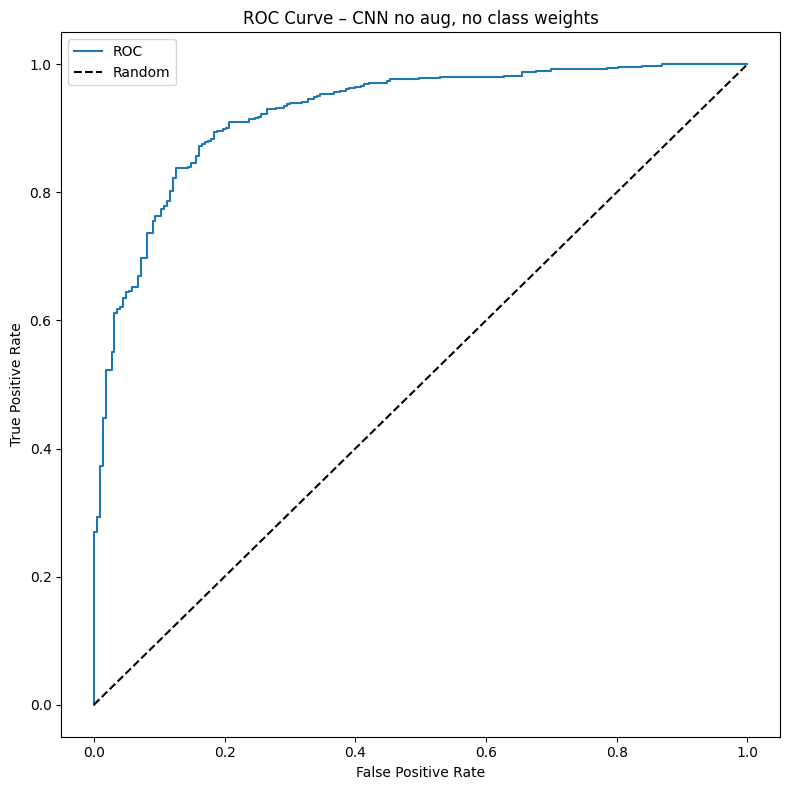

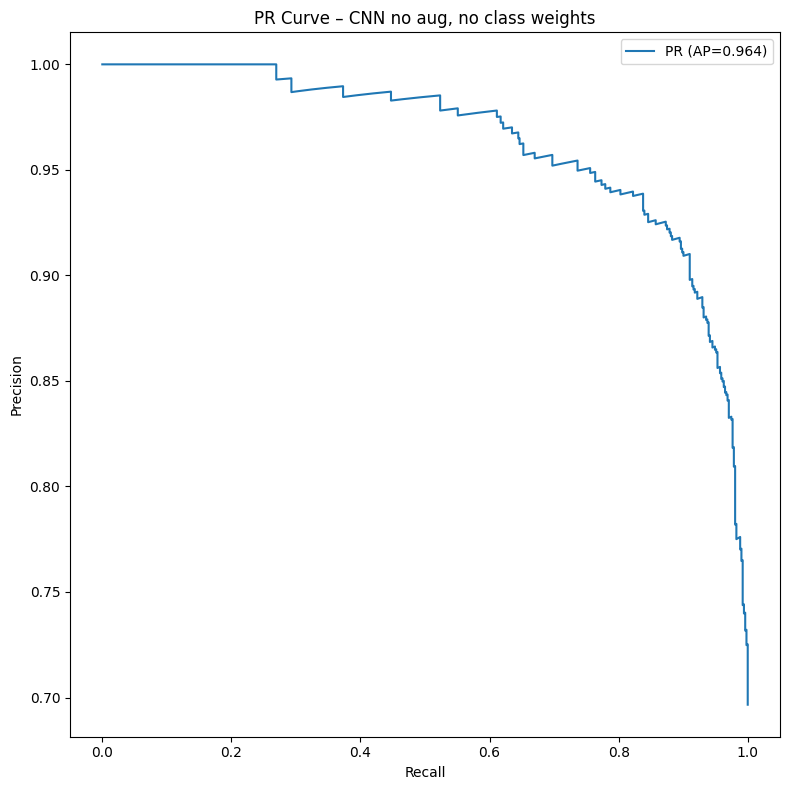

In [62]:
# =========================
# LOAD + PLOT PHASE
# (you can run this later in a fresh notebook)
# =========================

# 1) Recreate the model and load weights
model_cnn_noaug_noclassweight = CNN_V1().to(device)
state_dict = torch.load(model_path_cnn_noaug_noclassweight, map_location=device)
model_cnn_noaug_noclassweight.load_state_dict(state_dict)
model_cnn_noaug_noclassweight.eval()
print("✅ Model weights reloaded")

# 2) Reload training history
history_cnn_noaug_noclassweight_df = pd.read_csv(
    os.path.join(save_dir, "training_history.csv")
)

# 3) Reload y_true, y_prob and confusion matrix
y_true = np.load(os.path.join(save_dir, "y_true.npy"))
y_prob = np.load(os.path.join(save_dir, "y_prob.npy"))
cm = np.load(os.path.join(save_dir, "confusion_matrix.npy"))

# 4) Reload scalar metrics + classification report
with open(os.path.join(save_dir, "metrics.json"), "r") as f:
    metrics_cnn_noaug_noclassweight_json = json.load(f)

print("\n=== Classification report ===")
print(metrics_cnn_noaug_noclassweight_json["classification_report"])
print("ROC AUC:", metrics_cnn_noaug_noclassweight_json["roc_auc"])
print("AP (PR AUC):", metrics_cnn_noaug_noclassweight_json["average_precision"])

# 5) Plot everything again

# These functions work with a dict OR a DataFrame,
# since history["train_loss"] is valid for both.
plot_train_val_loss(history_cnn_noaug_noclassweight_df)
plot_accuracy(history_cnn_noaug_noclassweight_df)

plot_binary_confusion_matrix(cm)
plot_roc_curve(y_true, y_prob, title="ROC Curve – CNN no aug, no class weights")
plot_pr_curve(y_true, y_prob, title="PR Curve – CNN no aug, no class weights")


In [55]:

#plot_train_val_loss(history_cnn_noaug_noclassweight_df)
#plot_accuracy(history_cnn_noaug_noclassweight_df)

#plot_binary_confusion_matrix(metrics_cnn_noaug_noclassweight_json["confusion_matrix"])
#plot_roc_curve(y_true, y_prob, title="ROC Curve – CNN no aug, no class weights")
#plot_pr_curve(y_true, y_prob, title="PR Curve – CNN no aug, no class weights")

#print(metrics_cnn_noaug_noclassweight_json["classification_report"])
#print("ROC AUC:", metrics_cnn_noaug_noclassweight_json["roc_auc"])
#print("AP (PR AUC):", metrics_cnn_noaug_noclassweight_json["average_precision"])


##### Results (Images)

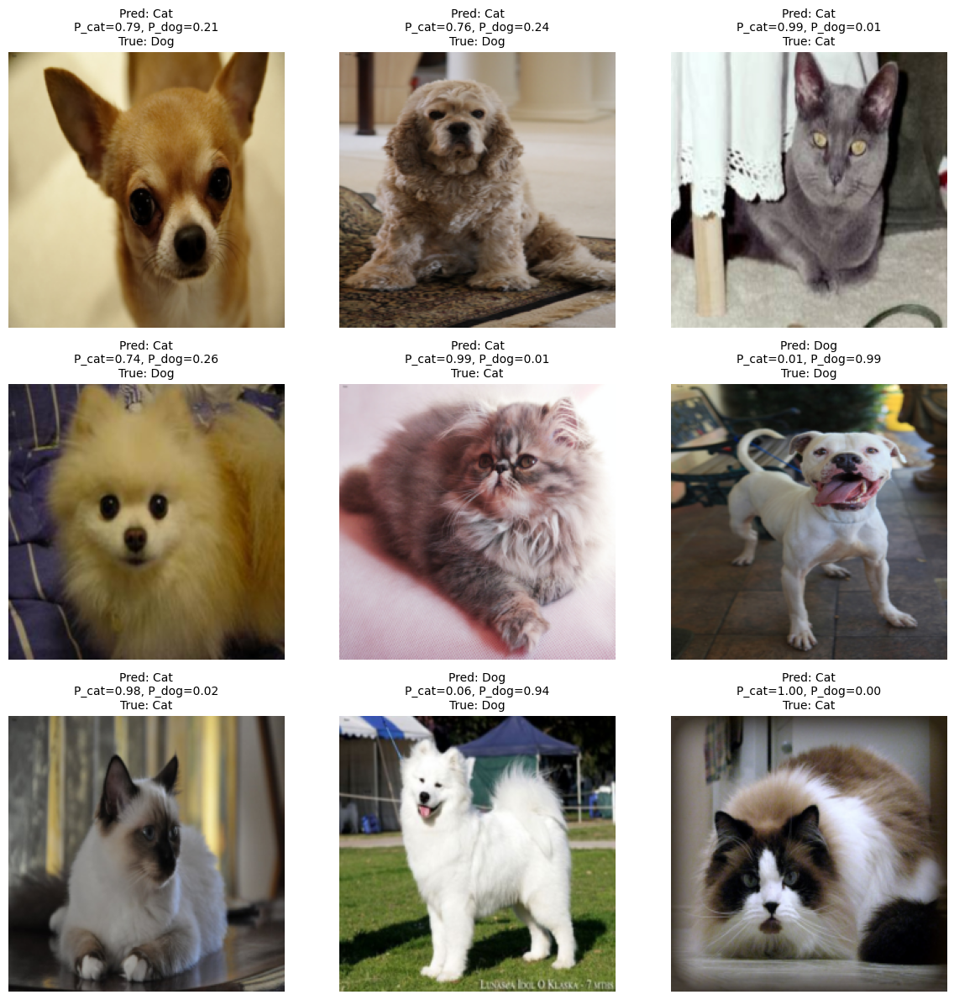

In [56]:
show_random_binary_classif_predictions(model_cnn_noaug_noclassweight, val_bininary_clf, device)


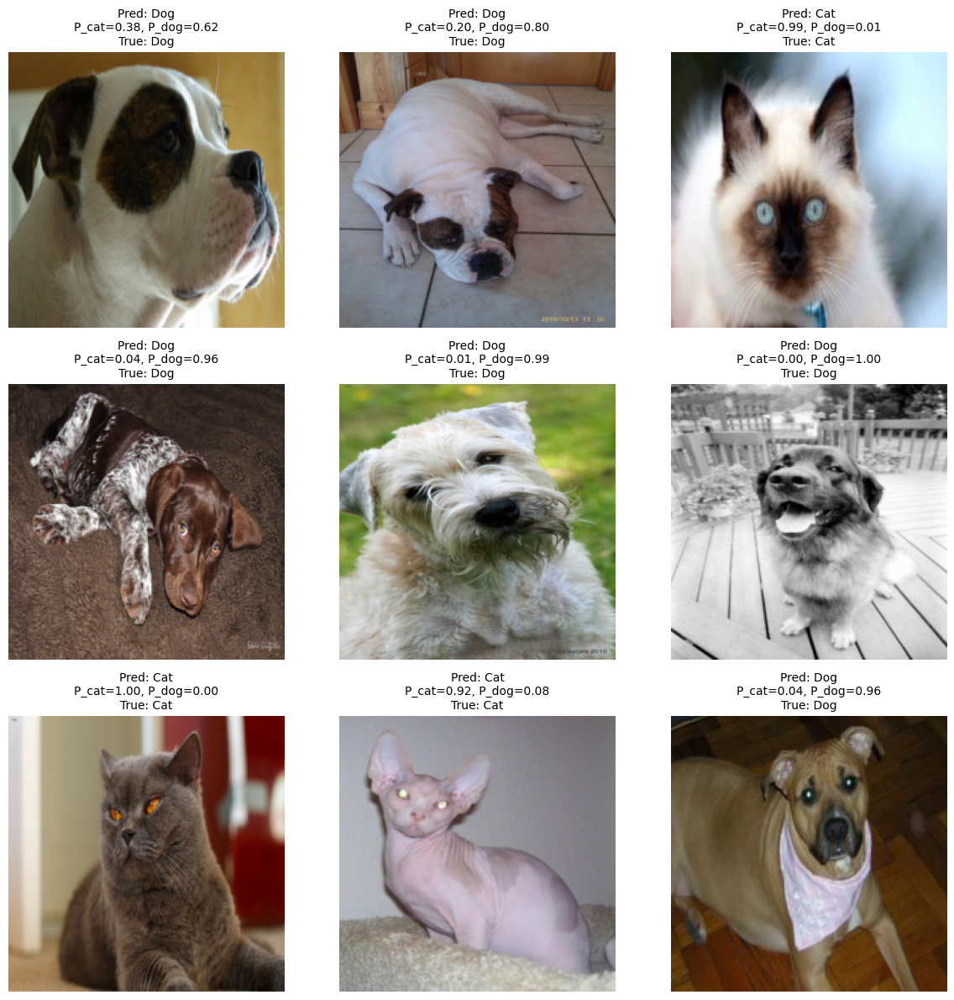

In [57]:
show_random_binary_classif_predictions(model_cnn_noaug_noclassweight, test_bininary_clf, device)


| Task | Criterion | Optimizer | Model | # Params | Augmentation | Epochs | Train Loss | Val Loss | Train Acc | Val Acc | ROC AUC | PR AUC (AP) | Precision Cat | Recall Cat | Precision Dog | Recall Dog | F1-Score Cat | F1-Score Dog |
|------|-----------|-----------|--------|-----------|--------------|--------|------------|----------|-----------|----------|----------|--------------|----------------|-------------|----------------|-------------|---------------|----------------|
| Binary Clf | CrossEntropyLoss | Adam (lr=1e-4, wd=1e-4) | CNN_V1 | xx,xxx | None | 30 | 0.1661 | 0.3793 | 0.933 | 0.848 | 0.924 | 0.963 | 0.709 | 0.843 | 0.926 | 0.850 | 0.770 | 0.886 |


#### 2.1.2 - Binary Classification : CNN, Without augmentation, With Class Weight

In [58]:
print("Train (%)")
print(train_df["species_name"].value_counts(normalize=True) * 100, "\n")

print("Val (%)")
print(val_df["species_name"].value_counts(normalize=True) * 100, "\n")

print("Test (%)")
print(test_df["species_name"].value_counts(normalize=True) * 100, "\n")


Train (%)
species_name
Dog    67.868685
Cat    32.131315
Name: proportion, dtype: float64 

Val (%)
species_name
Dog    69.659864
Cat    30.340136
Name: proportion, dtype: float64 

Test (%)
species_name
Dog    64.761905
Cat    35.238095
Name: proportion, dtype: float64 



In [59]:
#device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
#print(f"Using device: {device}") # mps is for macs with Apple Silicon

#model_cnn_noaug_withclassweights = CNN_V1().to(device)

#class_weights = compute_class_weight(
#    class_weight="balanced",
#    classes=np.array([0,1]),
#    y=train_df["species"].values
#)

#class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)
#criterion = nn.CrossEntropyLoss(weight=class_weights)
#optimizer = torch.optim.Adam(model_cnn_noaug_withclassweights.parameters(), lr=1e-4, weight_decay=1e-4)

- There are more dogs than cats, so we will need to balance the weights during training

### 2.2 - Binary Classification : CNN, With augmentation

### 2.3 - Binary Classification : Pre-Trained CNN, Without augmentation

### 2.4 - Binary Classification : Pre-Traiend CNN, With augmentation

### 2.5 - Conclusion on Binary Classification

## 3 - Multiclass (Breed) Classification

## 4 - Segmentation 

Note : Attention : certaines images n'ont pas de masques de segmentation, les retirer avant l'entraînement

In [60]:
# Images sans masques : 
#show_image_mask_bbox("Egyptian_Mau_20")
#show_image_mask_bbox("Egyptian_Mau_162")
#show_image_mask_bbox("Egyptian_Mau_165")
#show_image_mask_bbox("Egyptian_Mau_196")

#show_image_mask_bbox("leonberger_18")
#show_image_mask_bbox("miniature_pinscher_14")
#show_image_mask_bbox("japanese_chin_199")
#show_image_mask_bbox("keeshond_7")
#show_image_mask_bbox("Persian_259")
#show_image_mask_bbox("wheaten_terrier_195")

#show_image_mask_bbox("saint_bernard_15")
#show_image_mask_bbox("saint_bernard_60")
#show_image_mask_bbox("saint_bernard_78")
#show_image_mask_bbox("saint_bernard_108")
